In [ ]:
%matplotlib inline

import os
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"
import pandas as pd
import numpy as np
import random

import torch
import torch.nn as nn
import torch.nn.functional as F

import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler


import torchvision
import torchvision.transforms as transforms
from torch.utils.data import random_split
from torch.utils.data import Subset
from torchvision import datasets, transforms
import sys
import time
from PIL import Image

In [ ]:
!pip install torchinfo


In [ ]:
import torch
import gc

gc.collect()
torch.cuda.empty_cache()

In [ ]:
# For reproduce the result
torch.manual_seed(1220)
random.seed(1220)
np.random.seed(1220)

In [ ]:
# Check if GPU is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("You are using device: %s" % device)
print("You are using PyTorch version: %s" % torch.__version__)



You are using device: cuda
You are using PyTorch version: 2.6.0+cu124


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:


!apt install unrar

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
unrar is already the newest version (1:6.1.5-1ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.


In [ ]:
!unrar x "/content/drive/MyDrive/datasets.rar" "/content/datasets/"

Streaming output truncated to the last 5000 lines.
Extracting  /content/datasets/crack_classification/original/column/Vertical/cropped_129_jpg.rf.2220c7f7973cba820135c026acb9f5b0.jpg      98%  OK 
Extracting  /content/datasets/crack_classification/original/column/Vertical/cropped_CLD_000_jpg.rf.057e703fcfe61dacfc181b0bafab3e20.jpg      98%  OK 
Extracting  /content/datasets/crack_classification/original/column/Vertical/cropped_CLD_005_jpg.rf.c492ceedeb9d9e528baa2358b70449a5.jpg      98%  OK 
Extracting  /content/datasets/crack_classification/original/column/Vertical/cropped_CLD_010_jpg.rf.af3b508fc756f769ccb6ffe1ec878e22.jpg      98%  OK 
Extracting  /content/datasets/crack_classification/original/column/Vertical/cropped_CLD_011_jpg.rf.c1750f64662b3bc3b987d88525e8080f.jpg      98%  OK 
Extracting  /content/datasets/crack_classification/original/column/Vertical/cropped_CLD_014_jpg.rf.b7ace753fe607763f959f9731084bbe4.jpg      98%  OK 

In [ ]:
!mkdir -p /content/drive/MyDrive/FinalColumnModel

Using Inception V3 for Damage Classification

In [ ]:
from torch.utils.data import WeightedRandomSampler
from collections import Counter

# Load dataset
path_dataset = "/content/datasets/damage_classification_forTrain/column_damage"


tta_transforms = [
    transforms.Compose([
        transforms.Resize((299, 299)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ]),
    transforms.Compose([
        transforms.Resize((299, 299)),
        transforms.RandomHorizontalFlip(p=1.0),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ]),
    transforms.Compose([
        transforms.Resize((299, 299)),
        transforms.RandomRotation(10),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ])
]

def load_dataset(path_dataset):
    # Data transformations for training
    transform_train = transforms.Compose([
        transforms.Resize([299, 299]),
        transforms.RandomCrop(299, padding=4),
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(15),
        transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3),
        transforms.RandomAffine(degrees=10, translate=(0.1,0.1), scale =(0.9,1.1)),
        transforms.ToTensor(),
        #transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                     std=[0.229, 0.224, 0.225])

    ])

    ########################I added extra data augmentation for my training data

    # Data transformations for testing
    transform_test = transforms.Compose([
        transforms.Resize([299, 299]) ,
        transforms.ToTensor(),
        #transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                     std=[0.229, 0.224, 0.225])
         #apply only basic transformation to test data, no randomness
    ])

    # Create a non-augmented(no need for normalize) transform for visualization
    transform_noaug = transforms.Compose([
        transforms.Resize([299, 299]),
        transforms.ToTensor()
    ])


    full_dataset = datasets.ImageFolder(root=path_dataset, transform=None)  # No transform yet
    indices = torch.randperm(len(full_dataset))  # Fixed seed ensures reproducibility
    train_size = int(0.8 * len(full_dataset))
    train_indices, val_indices = indices[:train_size], indices[train_size:]

    trainset = Subset(
    datasets.ImageFolder(root=path_dataset, transform = transform_train),
    train_indices
    )
    valset = Subset(
    datasets.ImageFolder(root=path_dataset, transform = transform_test),
    val_indices
    )

    # ----- Create WeightedRandomSampler -----



    # also for visualization
    full_dataset_noaug = torchvision.datasets.ImageFolder(
        root=path_dataset,
        transform=transform_noaug
    )


    # Create data loaders
    trainloader = DataLoader(
        trainset, batch_size=32, shuffle=True, num_workers=2  #pytorch tutorial
    )

    valloader = DataLoader(
        valset, batch_size=32, shuffle=False, num_workers=2 #pytorch tutorial
    )


    # Map folder names to class names
    class_map = {i: full_dataset.classes[i] for i in range(len(full_dataset.classes))}
    print(f"Dataset classes: {class_map}")
    print("Using classes from dataset folder structure:", full_dataset.classes)


    return trainloader, valloader, full_dataset_noaug

# Define a composite transform for data augmentation for "visualizations" only, you can try to implement it for training
train_transformer_agumentation = transforms.Compose([
    transforms.ToPILImage(),  # Convert tensor to PIL Image (the format for transforms)
    transforms.RandomChoice([
        transforms.RandomCrop(299, padding=4, padding_mode='reflect'),
        transforms.RandomRotation(90),
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
        transforms.RandomAffine(degrees=0, shear=(0, 0, 0, 45)),
        transforms.RandomPerspective(distortion_scale=0.5, fill=0),
        transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.5),
    ]),

    transforms.ToTensor(),  # Convert back to tensor (the format for models)
])
# Transform for inference
train_transformer_inference = transforms.Compose([
    transforms.Resize([299, 299]),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])



print('Classes found:', sorted(os.listdir(path_dataset)))
trainloader, valloader, dataset_noaug = load_dataset(path_dataset)

Classes found: ['Class A', 'Class B', 'Class C']
Dataset classes: {0: 'Class A', 1: 'Class B', 2: 'Class C'}
Using classes from dataset folder structure: ['Class A', 'Class B', 'Class C']


In [ ]:
import math

os.environ["CUDA_LAUNCH_BLOCKING"] = "1"

import torch
import torch.nn as nn
import torchvision.models as models
import torch.nn.functional as F

from torchinfo import summary
from torchvision.models import inception_v3, Inception_V3_Weights


class DamageClassifier(nn.Module):
    def __init__(self, num_classes=3):
        super().__init__()
        weights = Inception_V3_Weights.DEFAULT
        base = inception_v3(weights=weights, aux_logits=True)  # aux_logits=True is required
        num_ftrs = base.fc.in_features
        base.fc = nn.Identity()
        self.backbone = base

        self.fc1 = nn.Linear(num_ftrs, 512)
        self.dropout = nn.Dropout(0.3)
        self.cls_head = nn.Linear(512, num_classes)

    def forward(self, x):
        output = self.backbone(x)
        if isinstance(output, tuple):  # Handle auxiliary logits
            output = output[0]
        x = torch.relu(self.fc1(output))
        x = self.dropout(x)
        return self.cls_head(x)

model_ = DamageClassifier(num_classes=3).to(device)
print(model_)
summary(model_, input_size=(8, 3, 299, 299))


DamageClassifier(
  (backbone): Inception3(
    (Conv2d_1a_3x3): BasicConv2d(
      (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_2a_3x3): BasicConv2d(
      (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_2b_3x3): BasicConv2d(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (Conv2d_3b_1x1): BasicConv2d(
      (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_4a_3x3

Layer (type:depth-idx)                   Output Shape              Param #
DamageClassifier                         [8, 3]                    --
├─Inception3: 1-1                        [8, 2048]                 3,326,696
│    └─BasicConv2d: 2-1                  [8, 32, 149, 149]         --
│    │    └─Conv2d: 3-1                  [8, 32, 149, 149]         864
│    │    └─BatchNorm2d: 3-2             [8, 32, 149, 149]         64
│    └─BasicConv2d: 2-2                  [8, 32, 147, 147]         --
│    │    └─Conv2d: 3-3                  [8, 32, 147, 147]         9,216
│    │    └─BatchNorm2d: 3-4             [8, 32, 147, 147]         64
│    └─BasicConv2d: 2-3                  [8, 64, 147, 147]         --
│    │    └─Conv2d: 3-5                  [8, 64, 147, 147]         18,432
│    │    └─BatchNorm2d: 3-6             [8, 64, 147, 147]         128
│    └─MaxPool2d: 2-4                    [8, 64, 73, 73]           --
│    └─BasicConv2d: 2-5                  [8, 80, 73, 73]           --

In [ ]:
import torch.nn.functional as F
from PIL import Image

def predict_tta(model, image_path, tta_transforms):
    model.eval()
    image = Image.open(image_path).convert('RGB')

    all_preds = []

    with torch.no_grad():
        for transform in tta_transforms:
            img_tensor = transform(image).unsqueeze(0).to(device)
            output = model(img_tensor)
            prob = F.softmax(output, dim=1)
            all_preds.append(prob)

    avg_output = torch.stack(all_preds).mean(dim=0)  # shape: [1, num_classes]
    predicted_class = torch.argmax(avg_output, dim=1).item()
    return predicted_class



In [ ]:
def evaluate(model, valloader):

    model.eval()
    correct = 0
    total = 0

    # Initialize lists for per-class accuracy
    num_classes = len(classes)
    class_correct = list(0. for i in range(num_classes))
    class_total = list(0. for i in range(num_classes))

    # Initialize confusion matrix
    confusion_matrix = torch.zeros(num_classes, num_classes)

    with torch.no_grad():
        for data in tqdm(valloader, desc="Evaluating"):
            images, labels = data
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            # Calculate per-class accuracy
            c = (predicted == labels).squeeze()
            for i in range(len(labels)):
                label = labels[i]
                class_correct[label] += c[i].item()
                class_total[label] += 1

                # Update confusion matrix
                confusion_matrix[label, predicted[i]] += 1

    overall_accuracy = 100 * correct / total
    print(f'Overall Accuracy: {overall_accuracy:.2f}%')


    return class_correct, class_total, confusion_matrix

In [ ]:
import copy
from collections import Counter

class FocalLoss(nn.Module):
    def __init__(self, gamma=2.0, weight=None):
        super().__init__()
        self.gamma = gamma
        self.ce = nn.CrossEntropyLoss(weight=weight)

    def forward(self, input, target):
        logp = F.log_softmax(input, dim=1)
        ce_loss = self.ce(input, target)
        p = torch.exp(-ce_loss)
        loss = (1 - p) ** self.gamma * ce_loss
        return loss.mean()

def train(model, trainloader, valloader, epochs=30):



    for param in model_.backbone.parameters():
      param.requires_grad = True



    criterion = nn.CrossEntropyLoss()  # For training, weight=class_weights_tensor,
    #val_criterion = nn.CrossEntropyLoss()  # For validation
    #criterion = FocalLoss(gamma=1.5, weight=class_weights_tensor)
    optimizer = torch.optim.SGD(model.parameters(), lr= 0.005, momentum=0.9,  weight_decay = 5e-4) #we assign a constant speed of learning rate, so it might not converge well, momentum is to make updates smooth because it sees past data
    #optimizer = torch.optim.Adam(model.parameters(), lr=0.0005, weight_decay=1e-4)

    #scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=3, factor=0.5)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=50)

    # Lists to store metrics for plotting
    # If you don't want to use this, there are plenty website and tools to visualize the training process, ex: TensorBoard, Weights & Biases, etc.
    # Just remember to zip them toghether as you submit the homwork
    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []
    best_val_acc = 0
    best_model_wts = copy.deepcopy(model.state_dict())
    trigger = 0
    patience =10

    # Training loop
    for epoch in range(epochs):
        # Training phase
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        # Wrap trainloader with tqdm for progress bar to make it looks nicer
        loop = tqdm(enumerate(trainloader), total=len(trainloader), leave=True)
        for i, (inputs, targets) in loop:
            inputs, targets = inputs.to(device), targets.to(device)

            # Zero the parameter gradients
            optimizer.zero_grad()

            # Forward + backward + optimize
            logits = model(inputs)  # logits = [batch_size, num_classes]
            loss = criterion(logits, targets)

            loss.backward()

            #Gradient clipping
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=10)

            optimizer.step()

            # Calculate accuracy
            _, predicted = torch.max(logits.data, 1)
            total += targets.size(0)
            correct += (predicted == targets).sum().item()

            # Update running loss
            running_loss += loss.item()

            # Update progress bar
            loop.set_description(f"Epoch [{epoch+1}/{epochs}]")
            loop.set_postfix(loss=running_loss/(i+1), accuracy=100.*correct/total)

        # Calculate epoch statistics for training
        epoch_train_loss = running_loss / len(trainloader)
        epoch_train_acc = 100. * correct / total
        train_losses.append(epoch_train_loss)
        train_accuracies.append(epoch_train_acc)

        # Validation phase
        model.eval()
        val_running_loss = 0.0
        val_correct = 0
        val_total = 0

        with torch.no_grad():
            for images, labels in valloader:
                images, labels = images.to(device), labels.to(device)

                # Forward pass
                outputs = model(images)
                val_loss = criterion(outputs, labels)
                val_running_loss += val_loss.item()


                # Calculate validation accuracy
                _, predicted = torch.max(outputs.data, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()

        # Calculate epoch statistics for validation
        epoch_val_loss = val_running_loss / len(valloader)
        epoch_val_acc = 100. * val_correct / val_total
        val_losses.append(epoch_val_loss)
        val_accuracies.append(epoch_val_acc)



        print(f"Epoch {epoch+1}/{epochs}")
        print(f"Train Loss: {epoch_train_loss:.4f}, Train Acc: {epoch_train_acc:.2f}%")
        print(f"Val Loss: {epoch_val_loss:.4f}, Val Acc: {epoch_val_acc:.2f}%")
        print("-" * 60)

        ################################# Change starts here
        #I add early stopping so that if my validation accuracy doesnt increase as my epochs increase, it will help prevent overfitting and save training time

        if epoch_val_acc > best_val_acc:
            best_val_acc = epoch_val_acc
            best_model_wts = copy.deepcopy(model.state_dict())  # Save best weights
            trigger = 0
        else:
            trigger += 1
            if trigger >= patience:
                print(f"Early stopping triggered at epoch {epoch + 1}")
                break

        # Step scheduler
        #scheduler.step()
        scheduler.step()

        #########################Change stops here


    model.load_state_dict(best_model_wts)
    print('Finished Training')

    return model, train_losses, train_accuracies, val_losses, val_accuracies

In [ ]:
def Save_Model():
    path = "/content/drive/MyDrive/best_model_column.pth"
    torch.save(model_.state_dict(), path)
    print(f"✅ Model saved to Google Drive at: {path}")

def Load_Model():
    path = "/content/drive/MyDrive/best_model_column.pth"
    model_.load_state_dict(torch.load(path, map_location=device))
    model_.eval()
    print("✅ Model loaded from Google Drive!")


In [ ]:
print("Starting training...")
trained_model, train_losses, train_accuracies, val_losses, val_accuracies = train(
    model_, trainloader, valloader, epochs=100
)

Starting training...


Epoch [1/100]: 100%|██████████| 19/19 [00:04<00:00,  3.89it/s, accuracy=47.4, loss=0.966]


Epoch 1/100
Train Loss: 0.9655, Train Acc: 47.36%
Val Loss: 0.7538, Val Acc: 59.18%
------------------------------------------------------------


Epoch [2/100]: 100%|██████████| 19/19 [00:04<00:00,  3.92it/s, accuracy=72.4, loss=0.698]


Epoch 2/100
Train Loss: 0.6976, Train Acc: 72.40%
Val Loss: 0.5470, Val Acc: 81.63%
------------------------------------------------------------


Epoch [3/100]: 100%|██████████| 19/19 [00:04<00:00,  3.92it/s, accuracy=82.3, loss=0.505]


Epoch 3/100
Train Loss: 0.5047, Train Acc: 82.28%
Val Loss: 0.4128, Val Acc: 85.71%
------------------------------------------------------------


Epoch [4/100]: 100%|██████████| 19/19 [00:04<00:00,  3.91it/s, accuracy=84.5, loss=0.369]


Epoch 4/100
Train Loss: 0.3686, Train Acc: 84.50%
Val Loss: 0.3462, Val Acc: 86.39%
------------------------------------------------------------


Epoch [5/100]: 100%|██████████| 19/19 [00:04<00:00,  3.91it/s, accuracy=88.4, loss=0.27]


Epoch 5/100
Train Loss: 0.2696, Train Acc: 88.42%
Val Loss: 0.3194, Val Acc: 86.39%
------------------------------------------------------------


Epoch [6/100]: 100%|██████████| 19/19 [00:04<00:00,  3.91it/s, accuracy=87.7, loss=0.267]


Epoch 6/100
Train Loss: 0.2668, Train Acc: 87.73%
Val Loss: 0.3046, Val Acc: 87.07%
------------------------------------------------------------


Epoch [7/100]: 100%|██████████| 19/19 [00:04<00:00,  3.93it/s, accuracy=88.8, loss=0.225]


Epoch 7/100
Train Loss: 0.2247, Train Acc: 88.76%
Val Loss: 0.2788, Val Acc: 87.76%
------------------------------------------------------------


Epoch [8/100]: 100%|██████████| 19/19 [00:04<00:00,  3.91it/s, accuracy=90.1, loss=0.199]


Epoch 8/100
Train Loss: 0.1986, Train Acc: 90.12%
Val Loss: 0.2687, Val Acc: 87.76%
------------------------------------------------------------


Epoch [9/100]: 100%|██████████| 19/19 [00:04<00:00,  3.93it/s, accuracy=91.1, loss=0.204]


Epoch 9/100
Train Loss: 0.2038, Train Acc: 91.14%
Val Loss: 0.2532, Val Acc: 89.12%
------------------------------------------------------------


Epoch [10/100]: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s, accuracy=94.7, loss=0.136]


Epoch 10/100
Train Loss: 0.1363, Train Acc: 94.72%
Val Loss: 0.2652, Val Acc: 91.16%
------------------------------------------------------------


Epoch [11/100]: 100%|██████████| 19/19 [00:04<00:00,  3.94it/s, accuracy=96.3, loss=0.121]


Epoch 11/100
Train Loss: 0.1211, Train Acc: 96.25%
Val Loss: 0.2129, Val Acc: 91.16%
------------------------------------------------------------


Epoch [12/100]: 100%|██████████| 19/19 [00:04<00:00,  3.92it/s, accuracy=97.4, loss=0.0964]


Epoch 12/100
Train Loss: 0.0964, Train Acc: 97.44%
Val Loss: 0.2231, Val Acc: 93.20%
------------------------------------------------------------


Epoch [13/100]: 100%|██████████| 19/19 [00:04<00:00,  3.94it/s, accuracy=97.4, loss=0.119]


Epoch 13/100
Train Loss: 0.1187, Train Acc: 97.44%
Val Loss: 0.2026, Val Acc: 92.52%
------------------------------------------------------------


Epoch [14/100]: 100%|██████████| 19/19 [00:04<00:00,  3.93it/s, accuracy=98.5, loss=0.0651]


Epoch 14/100
Train Loss: 0.0651, Train Acc: 98.47%
Val Loss: 0.1738, Val Acc: 93.88%
------------------------------------------------------------


Epoch [15/100]: 100%|██████████| 19/19 [00:04<00:00,  3.93it/s, accuracy=98.1, loss=0.0654]


Epoch 15/100
Train Loss: 0.0654, Train Acc: 98.13%
Val Loss: 0.2159, Val Acc: 93.20%
------------------------------------------------------------


Epoch [16/100]: 100%|██████████| 19/19 [00:04<00:00,  3.94it/s, accuracy=98.1, loss=0.0598]


Epoch 16/100
Train Loss: 0.0598, Train Acc: 98.13%
Val Loss: 0.2167, Val Acc: 94.56%
------------------------------------------------------------


Epoch [17/100]: 100%|██████████| 19/19 [00:04<00:00,  3.92it/s, accuracy=98.3, loss=0.0621]


Epoch 17/100
Train Loss: 0.0621, Train Acc: 98.30%
Val Loss: 0.2299, Val Acc: 94.56%
------------------------------------------------------------


Epoch [18/100]: 100%|██████████| 19/19 [00:04<00:00,  3.93it/s, accuracy=99, loss=0.0425]


Epoch 18/100
Train Loss: 0.0425, Train Acc: 98.98%
Val Loss: 0.2144, Val Acc: 94.56%
------------------------------------------------------------


Epoch [19/100]: 100%|██████████| 19/19 [00:04<00:00,  3.89it/s, accuracy=98.3, loss=0.0543]


Epoch 19/100
Train Loss: 0.0543, Train Acc: 98.30%
Val Loss: 0.3381, Val Acc: 91.84%
------------------------------------------------------------


Epoch [20/100]: 100%|██████████| 19/19 [00:04<00:00,  3.91it/s, accuracy=98.1, loss=0.0531]


Epoch 20/100
Train Loss: 0.0531, Train Acc: 98.13%
Val Loss: 0.3471, Val Acc: 90.48%
------------------------------------------------------------


Epoch [21/100]: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s, accuracy=98.3, loss=0.0568]


Epoch 21/100
Train Loss: 0.0568, Train Acc: 98.30%
Val Loss: 0.2802, Val Acc: 94.56%
------------------------------------------------------------


Epoch [22/100]: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s, accuracy=99, loss=0.0381]


Epoch 22/100
Train Loss: 0.0381, Train Acc: 98.98%
Val Loss: 0.2076, Val Acc: 95.24%
------------------------------------------------------------


Epoch [23/100]: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s, accuracy=99, loss=0.0542]


Epoch 23/100
Train Loss: 0.0542, Train Acc: 98.98%
Val Loss: 0.1934, Val Acc: 94.56%
------------------------------------------------------------


Epoch [24/100]: 100%|██████████| 19/19 [00:04<00:00,  3.92it/s, accuracy=98.8, loss=0.031]


Epoch 24/100
Train Loss: 0.0310, Train Acc: 98.81%
Val Loss: 0.2390, Val Acc: 95.24%
------------------------------------------------------------


Epoch [25/100]: 100%|██████████| 19/19 [00:04<00:00,  3.89it/s, accuracy=97.8, loss=0.0461]


Epoch 25/100
Train Loss: 0.0461, Train Acc: 97.79%
Val Loss: 0.2024, Val Acc: 95.92%
------------------------------------------------------------


Epoch [26/100]: 100%|██████████| 19/19 [00:04<00:00,  3.91it/s, accuracy=99.8, loss=0.0137]


Epoch 26/100
Train Loss: 0.0137, Train Acc: 99.83%
Val Loss: 0.2018, Val Acc: 95.92%
------------------------------------------------------------


Epoch [27/100]: 100%|██████████| 19/19 [00:04<00:00,  3.89it/s, accuracy=99.7, loss=0.0164]


Epoch 27/100
Train Loss: 0.0164, Train Acc: 99.66%
Val Loss: 0.2005, Val Acc: 96.60%
------------------------------------------------------------


Epoch [28/100]: 100%|██████████| 19/19 [00:04<00:00,  3.92it/s, accuracy=99.8, loss=0.0116]


Epoch 28/100
Train Loss: 0.0116, Train Acc: 99.83%
Val Loss: 0.2288, Val Acc: 95.92%
------------------------------------------------------------


Epoch [29/100]: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s, accuracy=99.7, loss=0.0188]


Epoch 29/100
Train Loss: 0.0188, Train Acc: 99.66%
Val Loss: 0.2100, Val Acc: 95.92%
------------------------------------------------------------


Epoch [30/100]: 100%|██████████| 19/19 [00:04<00:00,  3.93it/s, accuracy=99.8, loss=0.0102]


Epoch 30/100
Train Loss: 0.0102, Train Acc: 99.83%
Val Loss: 0.2021, Val Acc: 95.92%
------------------------------------------------------------


Epoch [31/100]: 100%|██████████| 19/19 [00:04<00:00,  3.94it/s, accuracy=100, loss=0.00446]


Epoch 31/100
Train Loss: 0.0045, Train Acc: 100.00%
Val Loss: 0.2445, Val Acc: 95.92%
------------------------------------------------------------


Epoch [32/100]: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s, accuracy=99.3, loss=0.0166]


Epoch 32/100
Train Loss: 0.0166, Train Acc: 99.32%
Val Loss: 0.2316, Val Acc: 95.92%
------------------------------------------------------------


Epoch [33/100]: 100%|██████████| 19/19 [00:04<00:00,  3.93it/s, accuracy=99.8, loss=0.00604]


Epoch 33/100
Train Loss: 0.0060, Train Acc: 99.83%
Val Loss: 0.2594, Val Acc: 95.24%
------------------------------------------------------------


Epoch [34/100]: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s, accuracy=99.7, loss=0.0314]


Epoch 34/100
Train Loss: 0.0314, Train Acc: 99.66%
Val Loss: 0.2593, Val Acc: 95.24%
------------------------------------------------------------


Epoch [35/100]: 100%|██████████| 19/19 [00:04<00:00,  3.93it/s, accuracy=99.8, loss=0.00865]


Epoch 35/100
Train Loss: 0.0086, Train Acc: 99.83%
Val Loss: 0.2330, Val Acc: 95.92%
------------------------------------------------------------


Epoch [36/100]: 100%|██████████| 19/19 [00:04<00:00,  3.89it/s, accuracy=99.7, loss=0.00853]


Epoch 36/100
Train Loss: 0.0085, Train Acc: 99.66%
Val Loss: 0.2224, Val Acc: 95.24%
------------------------------------------------------------


Epoch [37/100]: 100%|██████████| 19/19 [00:04<00:00,  3.93it/s, accuracy=99.8, loss=0.0258]


Epoch 37/100
Train Loss: 0.0258, Train Acc: 99.83%
Val Loss: 0.2528, Val Acc: 95.24%
------------------------------------------------------------
Early stopping triggered at epoch 37
Finished Training


In [ ]:
classes = ['A', 'B', 'C']

print("Starting evaluating...")
class_correct, class_total, confusion_matrix = evaluate(trained_model, valloader)

Starting evaluating...


Evaluating: 100%|██████████| 5/5 [00:00<00:00,  6.83it/s]

Overall Accuracy: 96.60%


In [ ]:
def plot_training_metrics(train_losses, train_accuracies, val_losses, val_accuracies):

    epochs = range(1, len(train_losses) + 1)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

    ax1.plot(epochs, train_losses, 'b-', label='Training Loss')
    ax1.plot(epochs, val_losses, 'r-', label='Validation Loss')
    ax1.set_title('Training and Validation Loss')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Loss')
    ax1.legend()
    ax1.grid(True)

    ax2.plot(epochs, train_accuracies, 'b-', label='Training Accuracy')
    ax2.plot(epochs, val_accuracies, 'r-', label='Validation Accuracy')
    ax2.set_title('Training and Validation Accuracy')
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('Accuracy (%)')
    ax2.legend()
    ax2.grid(True)

    plt.tight_layout()
    plt.show()

    fig.savefig('training_metrics.png')
    print("Training metrics plot saved as 'training_metrics.png'")
    return

In [ ]:
def plot_evaluation_metrics(class_correct, class_total, confusion_matrix):

    num_classes = len(classes)


    # Calculate accuracies and identify valid classes
    accuracies = []
    valid_classes = []

    print("\nPer-class Accuracy:")
    print("-" * 50)
    for i in range(num_classes):
        if class_total[i] > 0:  # Avoid division by zero
            accuracy = 100 * class_correct[i] / class_total[i]
            print(f'{classes[i]}: {accuracy:.2f}% ({int(class_correct[i])}/{int(class_total[i])})')
            accuracies.append(accuracy)
            valid_classes.append(classes[i])
        else:
            print(f'{classes[i]}: No samples')

    # Plot per-class accuracy as a bar chart
    plt.figure(figsize=(12, 6))
    plt.bar(valid_classes, accuracies, color='skyblue')
    plt.xlabel('Classes')
    plt.ylabel('Accuracy (%)')
    plt.title('Per-class Accuracy')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.savefig('per_class_accuracy.png')
    plt.show()

    # Normalize confusion matrix by row (true labels) and plot
    normalized_confusion_matrix = confusion_matrix.clone()  # Create a copy to avoid modifying the original
    for i in range(num_classes):
        if normalized_confusion_matrix[i].sum() > 0:
            normalized_confusion_matrix[i] = normalized_confusion_matrix[i] / normalized_confusion_matrix[i].sum()

    # Plot confusion matrix
    plt.figure(figsize=(10, 8))
    plt.imshow(normalized_confusion_matrix.cpu().numpy(), interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Normalized Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(num_classes)
    plt.xticks(tick_marks, classes, rotation=45, ha='right')
    plt.yticks(tick_marks, classes)

    thresh = normalized_confusion_matrix.cpu().numpy().max() / 2.0
    for i in range(num_classes):
        for j in range(num_classes):
            plt.text(j, i, f'{normalized_confusion_matrix[i, j]:.2f}',
                     horizontalalignment="center",
                     color="white" if normalized_confusion_matrix[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.savefig('confusion_matrix.png')
    plt.show()

    return

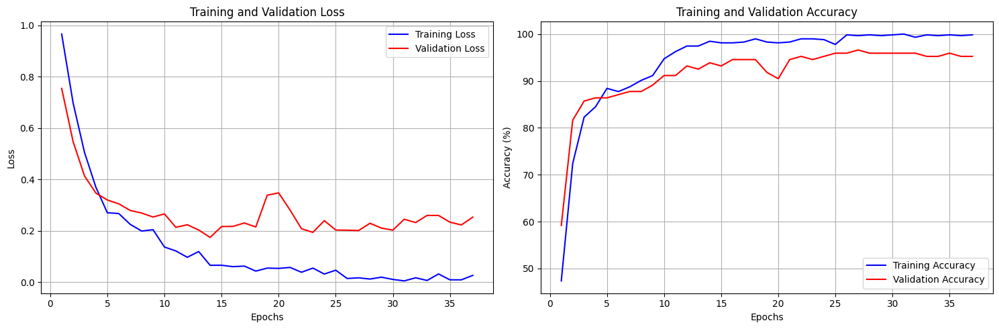

Training metrics plot saved as 'training_metrics.png'


In [ ]:
plot_training_metrics(train_losses, train_accuracies, val_losses, val_accuracies)


Per-class Accuracy:
--------------------------------------------------
A: 96.51% (83/86)
B: 92.31% (12/13)
C: 97.92% (47/48)


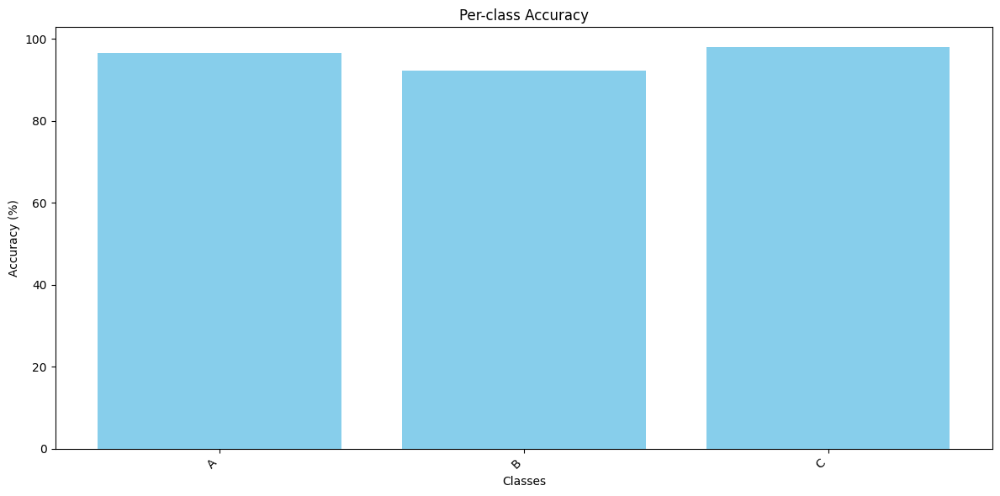

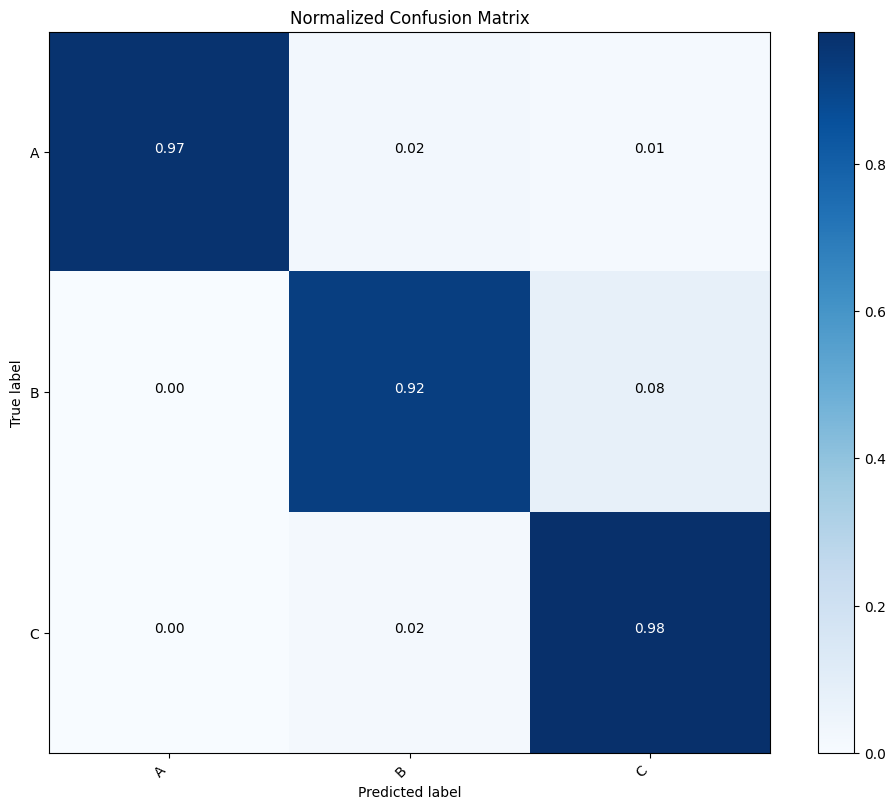

In [ ]:
plot_evaluation_metrics(class_correct, class_total, confusion_matrix)

In [ ]:
Save_Model()

✅ Model saved to Google Drive at: /content/drive/MyDrive/best_model_column.pth


In [ ]:
import shutil

source = "/content/drive/MyDrive/best_model_column.pth"
destination = "/content/drive/MyDrive/FinalColumnModel/best_model_column.pth"

shutil.copy(source, destination)
print(f"✅ Model copied to: {destination}")


✅ Model copied to: /content/drive/MyDrive/FinalColumnModel/best_model_column.pth


In [ ]:
from tqdm import tqdm
import os
from PIL import Image
import pandas as pd
import torch

# Paths
test_folder_path = "/content/datasets/test_data/column"
model_path = "/content/drive/MyDrive/best_model_column.pth"
file_extension = ".jpg"
csv_file_path = "/content/datasets/final_column_test.csv"  # new output file

# Class mapping: model output index → competition class label
idx_to_class = {0: 18, 1: 19, 2: 20}  # A → 18, B → 19, C → 20

# Load model
model_.load_state_dict(torch.load(model_path, map_location=device))
model_.to(device)
model_.eval()

# Get list of test image IDs
image_files = sorted([f for f in os.listdir(test_folder_path) if f.endswith(file_extension)])
image_ids = [os.path.splitext(f)[0] for f in image_files]

# Create new CSV DataFrame
df = pd.DataFrame({'id': image_ids, 'class': ''})

# Predict for each image using TTA
for idx, img_id in tqdm(enumerate(df['id']), total=len(df), desc="Generating TTA Predictions"):
    try:
        img_path = os.path.join(test_folder_path, img_id + file_extension)
        predicted_idx = predict_tta(model_, img_path, tta_transforms)
        df.at[idx, 'class'] = idx_to_class[predicted_idx]  # map to 18/19/20
    except Exception as e:
        print(f"❌ Error with image {img_id}: {e}")

# Save CSV
df.to_csv(csv_file_path, index=False)
print(f"✅ Submission CSV saved at: {csv_file_path}")


Generating TTA Predictions: 100%|██████████| 50/50 [00:03<00:00, 13.36it/s]

✅ Submission CSV saved at: /content/datasets/final_column_test.csv


In [ ]:
import pandas as pd

# Load your CSV (replace with your actual file path)
df = pd.read_csv("/content/datasets/final_column_test.csv")

# Ensure ID is treated as an integer
df['id'] = df['id'].astype(int)

# Sort by ID
df_sorted = df.sort_values(by='id').reset_index(drop=True)

# Save to a new CSV
df_sorted.to_csv("/content/datasets/sorted_final_column_test.csv", index=False)

print("✅ Sorted CSV saved as 'sorted_submission.csv'")


✅ Sorted CSV saved as 'sorted_submission.csv'


In [ ]:
from google.colab import files
files.download("/content/datasets/sorted_final_column_test.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import shutil

shutil.copy("/content/datasets/sorted_final_column_test.csv",
            "/content/drive/MyDrive/FinalColumnModel/sorted_final_column_test.csv")


'/content/drive/MyDrive/FinalColumnModel/sorted_final_column_test.csv'

In [ ]:
YOLO: Damage Detection

In [ ]:
yolo_model_path = "/content/drive/MyDrive/FinalColumnModel/column_detector_best.pt"


In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt


Cloning into 'yolov5'...
remote: Enumerating objects: 17488, done.
remote: Counting objects: 100% (2/2), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 17488 (delta 0), reused 0 (delta 0), pack-reused 17486 (from 2)
Receiving objects: 100% (17488/17488), 16.55 MiB | 14.45 MiB/s, done.
Resolving deltas: 100% (11995/11995), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 128.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 100.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 65.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 44.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 20.3 MB/s eta 0

In [ ]:
!pip install ultralytics

In [ ]:
from ultralytics import YOLO


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
yaml_content = """
path: /content/datasets/damage_detection/3class/for_training/datasets_3class_column_shuffled
train: train/images
val: val/images

names:
  0: rebar
  1: crack
  2: spalling
"""

with open("column.yaml", "w") as f:
    f.write(yaml_content)


# Load YOLOv11m model
model = YOLO("yolo11m.pt")


# Train
model.train(
    data="column.yaml",
    epochs=100,
    imgsz=640,
    batch=16,
    #conf=0.15,
    name="column_detector"
)




100%|██████████| 38.8M/38.8M [00:00<00:00, 48.1MB/s]

Ultralytics 8.3.152 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=column.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=column_detector, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=True

100%|██████████| 755k/755k [00:00<00:00, 116MB/s]

Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  1    111872  ultralytics.nn.modules.block.C3k2            [128, 256, 1, True, 0.25]     
  3                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  4                  -1  1    444928  ultralytics.nn.modules.block.C3k2            [256, 512, 1, True, 0.25]     
  5                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512, 512, 3, 2]              
  6                  -1  1   1380352  ultralytics.nn.modules.block.C3k2            [512, 512, 1, True]           
  7                  -1  1   2360320  ultralytics

 19                  -1  1   1511424  ultralytics.nn.modules.block.C3k2            [768, 512, 1, True]           
 20                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512, 512, 3, 2]              
 21            [-1, 10]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 22                  -1  1   1642496  ultralytics.nn.modules.block.C3k2            [1024, 512, 1, True]          
 23        [16, 19, 22]  1   1413337  ultralytics.nn.modules.head.Detect           [3, [256, 512, 512]]          
YOLO11m summary: 231 layers, 20,055,321 parameters, 20,055,305 gradients, 68.2 GFLOPs

Transferred 643/649 items from pretrained weights
Freezing layer 'model.23.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


100%|██████████| 5.35M/5.35M [00:00<00:00, 424MB/s]
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorit

AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1316.0±586.4 MB/s, size: 40.5 KB)


train: Scanning /content/datasets/damage_detection/3class/for_training/datasets_3class_column_shuffled/train/labels... 237 images, 6 backgrounds, 0 corrupt: 100%|██████████| 243/243 [00:00<00:00, 1518.99it/s]

train: New cache created: /content/datasets/damage_detection/3class/for_training/datasets_3class_column_shuffled/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 460.9±234.2 MB/s, size: 24.0 KB)


val: Scanning /content/datasets/damage_detection/3class/for_training/datasets_3class_column_shuffled/val/labels... 29 images, 0 backgrounds, 0 corrupt: 100%|██████████| 29/29 [00:00<00:00, 1416.02it/s]

val: New cache created: /content/datasets/damage_detection/3class/for_training/datasets_3class_column_shuffled/val/labels.cache


Plotting labels to runs/detect/column_detector/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 106 weight(decay=0.0), 113 weight(decay=0.0005), 112 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/column_detector
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.144      0.226      0.068     0.0203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.403      0.126     0.0553     0.0184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.365     0.0606     0.0135    0.00429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103     0.0865      0.172     0.0315     0.0102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103     0.0228      0.274     0.0145     0.0046



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103     0.0162      0.142    0.00762    0.00247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103     0.0216      0.248     0.0171    0.00404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.384       0.14     0.0298     0.0115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103     0.0694     0.0986     0.0377     0.0104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103     0.0418      0.105       0.04    0.00917



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.393      0.123     0.0384     0.0106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.151      0.145     0.0979     0.0327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.104      0.364     0.0949      0.026



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.541      0.141      0.105     0.0335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.137      0.157     0.0906     0.0279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.482      0.185     0.0929     0.0333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.261      0.223      0.112     0.0318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.259      0.197      0.178     0.0613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103       0.55      0.114     0.0848     0.0275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.261      0.201      0.118     0.0435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.153      0.156      0.103     0.0368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.255      0.313      0.198      0.064



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103       0.61      0.218      0.192     0.0707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.176       0.21      0.121     0.0437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.229      0.249      0.181      0.072



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.219      0.314      0.202     0.0775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.221      0.286       0.18     0.0675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.234      0.238      0.196     0.0697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.246       0.26      0.191     0.0714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103       0.62      0.182      0.172     0.0562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103       0.55      0.242      0.185     0.0726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.295       0.26      0.207     0.0683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103       0.59      0.217      0.202     0.0785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.563      0.161      0.143     0.0628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103       0.25      0.381      0.258      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103       0.35      0.358       0.24     0.0933



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.288      0.359      0.266     0.0958



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.294      0.371      0.241     0.0911



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.291      0.266      0.232     0.0974



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.244      0.257      0.221     0.0963



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.343       0.37      0.346      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.442      0.332      0.337      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.445       0.34      0.335      0.144



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.258      0.371      0.249     0.0883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.365      0.392      0.301      0.142



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.244      0.443       0.29      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.257       0.42      0.277      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103        0.7       0.24      0.228     0.0912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.268      0.344      0.268      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.292      0.304      0.211      0.094



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.339      0.389      0.299      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.285      0.382      0.287      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.403      0.264      0.296      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.204      0.442      0.268      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103       0.32      0.311      0.246      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103        0.4      0.241      0.249      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.334      0.293      0.229      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.263      0.316      0.249      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.285      0.471      0.292      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.222      0.423      0.272      0.124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.322      0.437      0.281      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.374      0.334       0.31      0.138



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.459      0.371      0.379      0.171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.513      0.427      0.412      0.192



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103       0.46      0.286       0.28      0.124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.292      0.331      0.246      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.311      0.297      0.228      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.428      0.263      0.241      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.297      0.325      0.274      0.131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.422      0.388      0.355      0.139



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.339       0.51      0.326      0.139



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.332      0.236      0.275      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.396      0.337      0.291      0.135



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.461      0.302      0.327      0.147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103       0.43      0.309      0.322      0.138



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.589      0.249      0.303      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.375      0.391      0.371      0.137



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103       0.33      0.501      0.386      0.165



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.341      0.376      0.317       0.16



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103       0.44      0.371      0.346      0.164



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.494      0.269      0.298      0.144



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.519      0.276      0.313      0.137



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.438      0.351      0.319      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.401      0.371      0.356      0.153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103       0.53      0.283       0.32      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.672      0.276      0.359      0.163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.483      0.308      0.349      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.431      0.336      0.329       0.16



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.493      0.309      0.326      0.153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103       0.54      0.308      0.323      0.148


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.525      0.292      0.299      0.139



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.509      0.275      0.291      0.135



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.405      0.296      0.296      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.325       0.42       0.32      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.393      0.411      0.348      0.162



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103       0.37      0.448      0.351      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.347      0.455      0.347      0.159



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.348      0.467      0.335      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.456      0.331      0.333      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/16 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, bu

                   all         29        103      0.474      0.311      0.337      0.159



100 epochs completed in 0.226 hours.
Optimizer stripped from runs/detect/column_detector/weights/last.pt, 40.5MB
Optimizer stripped from runs/detect/column_detector/weights/best.pt, 40.5MB

Validating runs/detect/column_detector/weights/best.pt...
Ultralytics 8.3.152 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/torch_utils.py:271: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  fusedconv.weight.copy_(torch.mm(w_bn, w_conv).view(fusedconv.weight.shape))
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/torch_utils.py:280: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this o

YOLO11m summary (fused): 125 layers, 20,032,345 parameters, 0 gradients, 67.7 GFLOPs


/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1357: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:217.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/block.py:1359: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic 

                   all         29        103      0.514      0.429      0.412      0.191
                 rebar          6          7      0.634      0.429      0.478      0.228
                 crack         26         50      0.357       0.46      0.324      0.145
              spalling         24         46       0.55      0.399      0.434        0.2
Speed: 0.2ms preprocess, 6.6ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/column_detector


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f63786b20d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04

In [ ]:
!cp column.yaml /content/drive/MyDrive/FinalColumnModel/column.yaml

In [ ]:
import shutil

# Path of the best.pt saved by YOLO
trained_model_path = "runs/detect/column_detector/weights/best.pt"

# Copy to Google Drive
shutil.copy(trained_model_path, yolo_model_path)
print("Model saved to Google Drive at:", yolo_model_path)

Model saved to Google Drive at: /content/drive/MyDrive/FinalColumnModel/column_detector_best.pt


In [ ]:
!cp runs/detect/column_detector/results.png /content/drive/MyDrive/FinalColumnModel/column_results.png


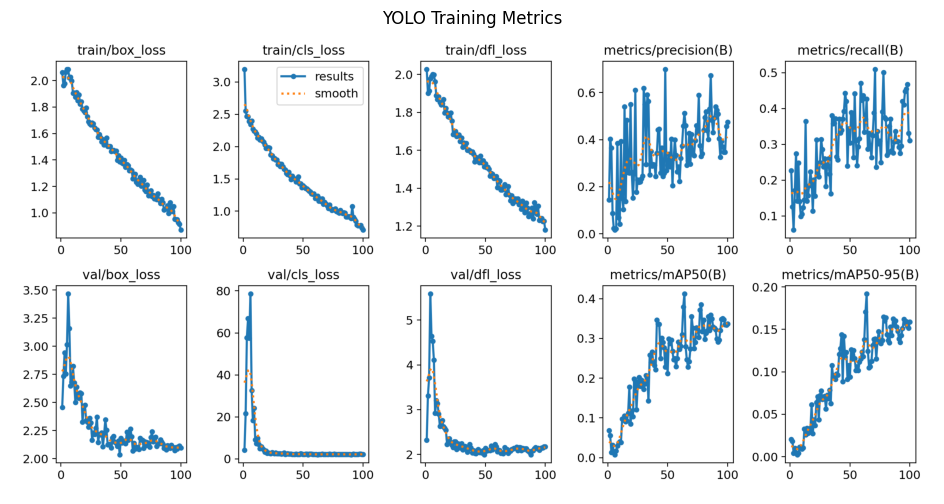

In [ ]:
import matplotlib.pyplot as plt
import cv2

img = cv2.imread("/content/drive/MyDrive/FinalColumnModel/column_results.png")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12, 6))
plt.imshow(img)
plt.axis('off')
plt.title("YOLO Training Metrics")
plt.show()



In [ ]:
metrics = model.val(data="/content/drive/MyDrive/FinalColumnModel/column.yaml", imgsz=640, batch=16)
print("mAP@0.5:", f"{metrics.box.map50:.2f}")       # mAP at IoU=0.50
print("mAP@0.5:0.95:", f"{metrics.box.map:.2f}")    # mean AP averaged over IoU thresholds from 0.50 to 0.95


Ultralytics 8.3.152 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
YOLO11m summary (fused): 125 layers, 20,032,345 parameters, 0 gradients, 67.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 900.2±278.9 MB/s, size: 23.4 KB)


val: Scanning /content/datasets/damage_detection/3class/for_training/datasets_3class_column_shuffled/val/labels.cache... 29 images, 0 backgrounds, 0 corrupt: 100%|██████████| 29/29 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.15it/s]


                   all         29        103      0.504      0.425      0.407      0.194
                 rebar          6          7       0.62      0.429      0.476      0.226
                 crack         26         50      0.365       0.46      0.324      0.149
              spalling         24         46      0.526      0.387       0.42      0.207
Speed: 2.3ms preprocess, 22.2ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detect/column_detector2
mAP@0.5: 0.41
mAP@0.5:0.95: 0.19


In [ ]:
# Create test-eval config file
yaml_test_eval = """
path: /content/datasets/damage_detection/3class/for_training/datasets_3class_column_shuffled
train: train/images
val: test/images

names:
  0: rebar
  1: crack
  2: spalling
"""

with open("column_test.yaml", "w") as f:
    f.write(yaml_test_eval)



In [ ]:
!cp column_test.yaml /content/drive/MyDrive/FinalColumnModel/column_test.yaml

In [ ]:
# Load trained YOLOv9 model
from ultralytics import YOLO
model = YOLO("/content/drive/MyDrive/FinalColumnModel/column_detector_best.pt")

# Run evaluation on test set
metrics = model.val(data="/content/drive/MyDrive/FinalColumnModel/column_test.yaml", imgsz=640, batch=16)

# Print summary
print(metrics)
print("mAP@0.5:", f"{metrics.box.map50:.2f}")       # mAP at IoU=0.50
print("mAP@0.5:0.95:", f"{metrics.box.map:.2f}")    # mean AP averaged over IoU thresholds from 0.50 to 0.95


Ultralytics 8.3.152 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
YOLO11m summary (fused): 125 layers, 20,032,345 parameters, 0 gradients, 67.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 8.7±6.3 MB/s, size: 22.7 KB)


val: Scanning /content/datasets/damage_detection/3class/for_training/datasets_3class_column_shuffled/test/labels... 32 images, 1 backgrounds, 0 corrupt: 100%|██████████| 33/33 [00:00<00:00, 1061.43it/s]

val: New cache created: /content/datasets/damage_detection/3class/for_training/datasets_3class_column_shuffled/test/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.15it/s]


                   all         33        111      0.457      0.442      0.458      0.231
                 rebar          7         11       0.36      0.364      0.356       0.18
                 crack         28         58      0.437      0.414      0.408      0.216
              spalling         26         42      0.575      0.547      0.609      0.298
Speed: 2.8ms preprocess, 28.0ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/val
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f63a8186dd0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0

In [ ]:
from ultralytics import YOLO

# Load your trained model
model = YOLO("/content/drive/MyDrive/FinalColumnModel/column_detector_best.pt")

# Run detection on your test set
results = model.predict(
    source="/content/datasets/test_data/column",
    conf=0.25,
    save=False,
    save_txt=True,
    save_conf=True
)





image 1/50 /content/datasets/test_data/column/1.jpg: 640x192 1 crack, 1 spalling, 97.4ms
image 2/50 /content/datasets/test_data/column/10.jpg: 640x256 1 crack, 99.5ms
image 3/50 /content/datasets/test_data/column/11.jpg: 640x160 2 cracks, 97.9ms
image 4/50 /content/datasets/test_data/column/12.jpg: 640x160 1 crack, 2 spallings, 18.3ms
image 5/50 /content/datasets/test_data/column/13.jpg: 640x128 3 spallings, 97.0ms
image 6/50 /content/datasets/test_data/column/14.jpg: 640x416 1 rebar, 1 spalling, 98.9ms
image 7/50 /content/datasets/test_data/column/15.jpg: 640x352 3 cracks, 1 spalling, 97.2ms
image 8/50 /content/datasets/test_data/column/16.jpg: 640x320 2 cracks, 2 spallings, 101.5ms
image 9/50 /content/datasets/test_data/column/17.jpg: 640x416 1 crack, 1 spalling, 20.5ms
image 10/50 /content/datasets/test_data/column/18.jpg: 640x160 3 spallings, 19.2ms
image 11/50 /content/datasets/test_data/column/19.jpg: 448x640 4 cracks, 100.6ms
image 12/50 /content/datasets/test_data/column/2.jpg

In [ ]:
import matplotlib.pyplot as plt

# Plot and display confusion matrix
metrics.confusion_matrix.plot()

# Show it explicitly (especially needed in Jupyter/Colab)
plt.show()

In [ ]:
print(metrics.box.map50)
print(metrics.confusion_matrix.matrix)


0.45775004371679523
[[          3           0           4           5]
 [          0          24           2          31]
 [          0           3          18          19]
 [          8          31          18           0]]


In [ ]:
!mkdir -p /content/drive/MyDrive/FinalColumnModel/column_predict/


In [ ]:
!cp -r runs/detect/predict/labels /content/drive/MyDrive/FinalColumnModel/column_predict/labels


In [ ]:
import os

yolo_dir = "/content/drive/MyDrive/FinalColumnModel/column_predict/labels"
image_ids = [f.replace(".txt", "") for f in os.listdir(yolo_dir)]

detections = {}
for file in os.listdir(yolo_dir):
    with open(os.path.join(yolo_dir, file)) as f:
        rows = [line.strip().split() for line in f]
    class_ids = [int(row[0]) for row in rows]
    detections[file.replace(".txt", "")] = class_ids  # dict[image_id] = [0, 1, 2]


In [ ]:
import pandas as pd

# Load class predictions from CSV
class_df = pd.read_csv("/content/drive/MyDrive/FinalColumnModel/sorted_final_column_test.csv")

# Create a dictionary for fast lookup
damage_classes = dict(zip(class_df["id"].astype(str), class_df["class"]))


In [ ]:
##### Getting cropped images from yolo boxes


In [ ]:
def get_yolo_boxes(img_id, target_class, label_dir="/content/drive/MyDrive/FinalColumnModel/column_predict/labels"):
    boxes = []
    label_path = os.path.join(label_dir, img_id + ".txt")
    if not os.path.exists(label_path):
        return boxes

    with open(label_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            cls = int(parts[0])
            if cls == target_class:
                # YOLO format: class x_center y_center width height
                boxes.append([float(x) for x in parts[1:5]])
    return boxes


In [ ]:
from PIL import Image

def crop_image(img_path, yolo_box):
    # yolo_box = [x_center, y_center, width, height] (all normalized)
    image = Image.open(img_path).convert("RGB")
    W, H = image.size

    x_c, y_c, w, h = [x * W if i % 2 == 0 else x * H for i, x in enumerate(yolo_box)]
    x1 = int(max(x_c - w / 2, 0))
    y1 = int(max(y_c - h / 2, 0))
    x2 = int(min(x_c + w / 2, W))
    y2 = int(min(y_c + h / 2, H))

    return image.crop((x1, y1, x2, y2))

In [ ]:
from torchvision.datasets import ImageFolder
from PIL import Image

class ImageFolderWithHough(ImageFolder):
    def __getitem__(self, index):
        path, target = self.samples[index]
        image = Image.open(path).convert("RGB")

        # Extract visual and Hough features
        hough_feats = extract_hough_features_advanced(image)
        image_tensor = self.transform(image)

        return image_tensor, hough_feats, target


In [ ]:
import cv2
import numpy as np
from scipy.stats import entropy
from itertools import combinations

def extract_hough_features_advanced(pil_image):
    image = np.array(pil_image.convert("RGB"))
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(gray, 50, 150)

    # --- 1. Standard Hough Line Transform for angle features ---
    lines = cv2.HoughLines(edges, 1, np.pi / 180, threshold=50)
    theta_list = []

    horiz = vert = diag_45 = diag_135 = 0

    if lines is not None:
        for rho, theta in lines[:, 0]:
            deg = np.degrees(theta)
            theta_list.append(deg)
            if abs(deg - 0) < 10 or abs(deg - 180) < 10:
                horiz += 1
            elif abs(deg - 90) < 10:
                vert += 1
            elif abs(deg - 45) < 10:
                diag_45 += 1
            elif abs(deg - 135) < 10:
                diag_135 += 1

    # Histogram & entropy of angles
    hist, _ = np.histogram(theta_list, bins=np.linspace(0, 180, 19))  # 10° bins
    angle_entropy = entropy(hist + 1e-6)
    num_peaks = np.sum(hist > 5)

    # --- 2. Probabilistic Hough Line Transform for lengths and intersections ---
    linesP = cv2.HoughLinesP(edges, 1, np.pi / 180, threshold=30, minLineLength=20, maxLineGap=5)
    avg_length = 0
    intersection_count = 0

    if linesP is not None and len(linesP) > 1:
        lengths = []
        for x1, y1, x2, y2 in linesP[:, 0]:
            lengths.append(np.hypot(x2 - x1, y2 - y1))
        avg_length = np.mean(lengths)

        # Count pairwise line intersections
        def ccw(A, B, C):
            return (C[1]-A[1]) * (B[0]-A[0]) > (B[1]-A[1]) * (C[0]-A[0])

        def lines_intersect(A, B, C, D):
            return ccw(A, C, D) != ccw(B, C, D) and ccw(A, B, C) != ccw(A, B, D)

        for (x1a, y1a, x2a, y2a), (x1b, y1b, x2b, y2b) in combinations(linesP[:, 0], 2):
            if lines_intersect((x1a, y1a), (x2a, y2a), (x1b, y1b), (x2b, y2b)):
                intersection_count += 1

    # --- 3. Dominance Ratio ---
    total_dirs = horiz + vert + diag_45 + diag_135 + 1e-6
    dominance_ratio = max(horiz, vert, diag_45, diag_135) / total_dirs

    # Final feature vector
    feature_vector = np.array([
        horiz,
        vert,
        diag_45,
        diag_135,
        num_peaks,
        angle_entropy,
        avg_length,
        intersection_count,
        dominance_ratio
    ], dtype=np.float32)

    return feature_vector


In [ ]:
import os
import shutil
import random

src_dir = "/content/datasets/crack_classification/original/column"
target_dir = "/content/datasets/crack_classification/split/column"

# Define train/val folders
train_dir = os.path.join(target_dir, "train")
val_dir = os.path.join(target_dir, "val")
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)

# For each class folder
for class_name in os.listdir(src_dir):
    class_path = os.path.join(src_dir, class_name)
    if not os.path.isdir(class_path):
        continue

    images = os.listdir(class_path)
    random.shuffle(images)

    split_idx = int(0.8 * len(images))
    train_imgs = images[:split_idx]
    val_imgs = images[split_idx:]

    # Make subfolders
    os.makedirs(os.path.join(train_dir, class_name), exist_ok=True)
    os.makedirs(os.path.join(val_dir, class_name), exist_ok=True)

    # Move files
    for img in train_imgs:
        shutil.copy(os.path.join(class_path, img), os.path.join(train_dir, class_name, img))
    for img in val_imgs:
        shutil.copy(os.path.join(class_path, img), os.path.join(val_dir, class_name, img))

print("✅ Dataset split complete.")


✅ Dataset split complete.


Training VIT Model

In [ ]:
import torch
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import torchvision.models as models
import torch.nn as nn
import torch.optim as optim

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Transforms
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Datasets
train_path = "/content/datasets/crack_classification/split/column/train"
val_path = "/content/datasets/crack_classification/split/column/val"

#train_dataset = ImageFolder(train_path, transform=transform)
#val_dataset = ImageFolder(val_path, transform=transform)

train_dataset = ImageFolderWithHough(train_path, transform=transform)
val_dataset = ImageFolderWithHough(val_path, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)





class_names = train_dataset.classes
num_classes = len(class_names)

print(f"Detected classes: {class_names}")


Detected classes: ['Diagonal', 'Horizontal', 'Horizontal_large', 'Vertical', 'Vertical_large', 'Web', 'X-shape']


In [ ]:
import cv2
import numpy as np

def extract_hough_features(pil_image):
    image = np.array(pil_image.convert("RGB"))
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(gray, 50, 150)
    lines = cv2.HoughLines(edges, 1, np.pi / 180, threshold=50)

    # Initialize direction counters
    horiz = vert = diag_45 = diag_135 = 0
    theta_list = []

    if lines is not None:
        for rho, theta in lines[:, 0]:
            deg = np.degrees(theta)
            theta_list.append(deg)
            if abs(deg - 0) < 10 or abs(deg - 180) < 10:
                horiz += 1
            elif abs(deg - 90) < 10:
                vert += 1
            elif abs(deg - 45) < 10:
                diag_45 += 1
            elif abs(deg - 135) < 10:
                diag_135 += 1

    # Histogram-based peak count
    hist, _ = np.histogram(theta_list, bins=np.arange(0, 181, 5))
    num_peaks = np.sum(hist > 5)

    return np.array([horiz, vert, diag_45, diag_135, num_peaks], dtype=np.float32)


In [ ]:
import torch.nn as nn

class ViTWithHough(nn.Module):
    def __init__(self, vit_model, num_classes, hough_dim=9):
        super(ViTWithHough, self).__init__()
        self.vit = vit_model
        vit_out_dim = self.vit.heads[0].in_features
        self.vit.heads = nn.Identity()  # Remove old head
        self.classifier = nn.Sequential(
            nn.Linear(vit_out_dim + hough_dim, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, num_classes)
        )

    def forward(self, images, hough_feats):
        vit_feats = self.vit(images)
        combined = torch.cat((vit_feats, hough_feats), dim=1)
        return self.classifier(combined)


In [ ]:
# Load base ViT
vit = models.vit_b_16(weights=models.ViT_B_16_Weights.DEFAULT)

# Wrap it with your custom Hough-aware classifier
model = ViTWithHough(vit_model=vit, num_classes=7, hough_dim =9).to(device)




In [ ]:
import copy
from tqdm import tqdm

import torch
import numpy as np

def evaluate(model, dataloader, criterion, num_classes=None):
    model.eval()
    total_loss = 0.0
    correct = 0
    total = 0

    if num_classes is None:
        num_classes = len(dataloader.dataset.classes)

    class_correct = [0 for _ in range(num_classes)]
    class_total = [0 for _ in range(num_classes)]
    confusion_matrix = torch.zeros(num_classes, num_classes)

    with torch.no_grad():
     #  for images, labels in dataloader:
            #images, labels = images.to(device), labels.to(device)
            #outputs = model(images)

        for images, hough_feats, labels in dataloader:
            images = images.to(device)
            hough_feats = hough_feats.to(device)
            labels = labels.to(device)

            outputs = model(images, hough_feats)
            loss = criterion(outputs, labels)
            total_loss += loss.item()

            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            for i in range(len(labels)):
                true = labels[i].item()
                pred = predicted[i].item()
                confusion_matrix[true, pred] += 1
                if true == pred:
                    class_correct[true] += 1
                class_total[true] += 1

    avg_loss = total_loss / len(dataloader)
    accuracy = 100. * correct / total
    print(f"Overall Accuracy: {accuracy:.2f}%")
    return class_correct, class_total, confusion_matrix


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import copy

def train_vit(model, trainloader, valloader, epochs=30, lr=0.0005, patience=10):
    # Make sure all ViT parameters are trainable
    for param in model.parameters():
        param.requires_grad = True

    # Define loss, optimizer, scheduler
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=lr, momentum=0.9, weight_decay=5e-4)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    # Best model tracking
    best_model_wts = copy.deepcopy(model.state_dict())
    best_val_acc = 0.0
    trigger = 0

    # Tracking
    train_losses, val_losses = [], []
    train_accs, val_accs = [], []

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        loop = tqdm(enumerate(trainloader), total=len(trainloader), desc=f"Epoch {epoch+1}/{epochs}")
     #   for i, (inputs, targets) in loop:
         #   inputs, targets = inputs.to(device), targets.to(device)
          #  optimizer.zero_grad()

         #   outputs = model(inputs)

        for i, (images, hough_feats, targets) in loop:
            images = images.to(device)
            hough_feats = hough_feats.to(device)
            targets = targets.to(device)

            outputs = model(images, hough_feats)
            loss = criterion(outputs, targets)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=10)
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += targets.size(0)
            correct += (predicted == targets).sum().item()

            loop.set_postfix(loss=running_loss / (i+1), acc=100. * correct / total)

        epoch_train_loss = running_loss / len(trainloader)
        epoch_train_acc = 100. * correct / total
        train_losses.append(epoch_train_loss)
        train_accs.append(epoch_train_acc)

        # ----- Validation -----
        model.eval()
        val_running_loss = 0.0
        val_correct = 0
        val_total = 0

        with torch.no_grad():
        #    for images, labels in valloader:
             #   images, labels = images.to(device), labels.to(device)
              #  outputs = model(images)
          for images, hough_feats, labels in valloader:
                images = images.to(device)
                hough_feats = hough_feats.to(device)
                labels = labels.to(device)

                outputs = model(images, hough_feats)
                val_loss = criterion(outputs, labels)
                val_running_loss += val_loss.item()
                _, predicted = torch.max(outputs.data, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()

        epoch_val_loss = val_running_loss / len(valloader)
        epoch_val_acc = 100. * val_correct / val_total
        val_losses.append(epoch_val_loss)
        val_accs.append(epoch_val_acc)

        print(f"Epoch {epoch+1}/{epochs}")
        print(f"Train Loss: {epoch_train_loss:.4f}, Train Acc: {epoch_train_acc:.2f}%")
        print(f"Val Loss: {epoch_val_loss:.4f}, Val Acc: {epoch_val_acc:.2f}%")
        print("-" * 60)

        if epoch_val_acc > best_val_acc:
            best_val_acc = epoch_val_acc
            best_model_wts = copy.deepcopy(model.state_dict())
            trigger = 0
        else:
            trigger += 1
            if trigger >= patience:
                print(f"Early stopping triggered at epoch {epoch + 1}")
                break

        scheduler.step()

    model.load_state_dict(best_model_wts)
    torch.save(model.state_dict(), "best_vit_model.pth")
    print(f"✅ Finished Training | Best Val Acc: {best_val_acc:.2f}%")

    return model, train_losses, train_accs, val_losses, val_accs




In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import copy

def train_vit(model, trainloader, valloader, epochs=30, lr=0.0005, patience=10):
    # Make sure all ViT parameters are trainable
    for param in model.parameters():
        param.requires_grad = True

    # Define loss, optimizer, scheduler
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=lr, momentum=0.9, weight_decay=5e-4)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    # Best model tracking
    best_model_wts = copy.deepcopy(model.state_dict())
    best_val_acc = 0.0
    trigger = 0

    # Tracking
    train_losses, val_losses = [], []
    train_accs, val_accs = [], []

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        loop = tqdm(enumerate(trainloader), total=len(trainloader), desc=f"Epoch {epoch+1}/{epochs}")
     #   for i, (inputs, targets) in loop:
         #   inputs, targets = inputs.to(device), targets.to(device)
          #  optimizer.zero_grad()

         #   outputs = model(inputs)

        for i, (images, hough_feats, targets) in loop:
            images = images.to(device)
            hough_feats = hough_feats.to(device)
            targets = targets.to(device)

            outputs = model(images, hough_feats)
            loss = criterion(outputs, targets)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=10)
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += targets.size(0)
            correct += (predicted == targets).sum().item()

            loop.set_postfix(loss=running_loss / (i+1), acc=100. * correct / total)

        epoch_train_loss = running_loss / len(trainloader)
        epoch_train_acc = 100. * correct / total
        train_losses.append(epoch_train_loss)
        train_accs.append(epoch_train_acc)

        # ----- Validation -----
        model.eval()
        val_running_loss = 0.0
        val_correct = 0
        val_total = 0

        with torch.no_grad():
        #    for images, labels in valloader:
             #   images, labels = images.to(device), labels.to(device)
              #  outputs = model(images)
          for images, hough_feats, labels in valloader:
                images = images.to(device)
                hough_feats = hough_feats.to(device)
                labels = labels.to(device)

                outputs = model(images, hough_feats)
                val_loss = criterion(outputs, labels)
                val_running_loss += val_loss.item()
                _, predicted = torch.max(outputs.data, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()

        epoch_val_loss = val_running_loss / len(valloader)
        epoch_val_acc = 100. * val_correct / val_total
        val_losses.append(epoch_val_loss)
        val_accs.append(epoch_val_acc)

        print(f"Epoch {epoch+1}/{epochs}")
        print(f"Train Loss: {epoch_train_loss:.4f}, Train Acc: {epoch_train_acc:.2f}%")
        print(f"Val Loss: {epoch_val_loss:.4f}, Val Acc: {epoch_val_acc:.2f}%")
        print("-" * 60)

        if epoch_val_acc > best_val_acc:
            best_val_acc = epoch_val_acc
            best_model_wts = copy.deepcopy(model.state_dict())
            trigger = 0
        else:
            trigger += 1
            if trigger >= patience:
                print(f"Early stopping triggered at epoch {epoch + 1}")
                break

        scheduler.step()

    model.load_state_dict(best_model_wts)
    torch.save(model.state_dict(), "best_vit_model.pth")
    print(f"✅ Finished Training | Best Val Acc: {best_val_acc:.2f}%")

    return model, train_losses, train_accs, val_losses, val_accs
trained_model, train_losses, train_accs, val_losses, val_accs = train_vit(
    model, train_loader, val_loader, epochs=50
)


Epoch 1/50: 100%|██████████| 22/22 [01:03<00:00,  2.87s/it, acc=23.2, loss=3.41]


Epoch 1/50
Train Loss: 3.4079, Train Acc: 23.22%
Val Loss: 3.4512, Val Acc: 39.38%
------------------------------------------------------------


Epoch 2/50: 100%|██████████| 22/22 [01:03<00:00,  2.88s/it, acc=36.5, loss=3.41]


Epoch 2/50
Train Loss: 3.4137, Train Acc: 36.54%
Val Loss: 3.7443, Val Acc: 45.56%
------------------------------------------------------------


Epoch 3/50: 100%|██████████| 22/22 [01:03<00:00,  2.88s/it, acc=41.6, loss=2.96]


Epoch 3/50
Train Loss: 2.9594, Train Acc: 41.57%
Val Loss: 2.6002, Val Acc: 47.10%
------------------------------------------------------------


Epoch 4/50: 100%|██████████| 22/22 [01:03<00:00,  2.87s/it, acc=48.1, loss=3.55]


Epoch 4/50
Train Loss: 3.5482, Train Acc: 48.08%
Val Loss: 1.9055, Val Acc: 52.90%
------------------------------------------------------------


Epoch 5/50: 100%|██████████| 22/22 [01:03<00:00,  2.87s/it, acc=47.3, loss=2.36]


Epoch 5/50
Train Loss: 2.3631, Train Acc: 47.34%
Val Loss: 1.7333, Val Acc: 50.58%
------------------------------------------------------------


Epoch 6/50: 100%|██████████| 22/22 [01:03<00:00,  2.87s/it, acc=53.3, loss=1.99]


Epoch 6/50
Train Loss: 1.9914, Train Acc: 53.25%
Val Loss: 1.9912, Val Acc: 56.37%
------------------------------------------------------------


Epoch 7/50: 100%|██████████| 22/22 [01:03<00:00,  2.87s/it, acc=55.6, loss=2.02]


Epoch 7/50
Train Loss: 2.0153, Train Acc: 55.62%
Val Loss: 2.2426, Val Acc: 54.44%
------------------------------------------------------------


Epoch 8/50: 100%|██████████| 22/22 [01:03<00:00,  2.86s/it, acc=56.8, loss=1.79]


Epoch 8/50
Train Loss: 1.7909, Train Acc: 56.80%
Val Loss: 1.3266, Val Acc: 58.69%
------------------------------------------------------------


Epoch 9/50: 100%|██████████| 22/22 [01:03<00:00,  2.88s/it, acc=57.4, loss=1.53]


Epoch 9/50
Train Loss: 1.5260, Train Acc: 57.40%
Val Loss: 1.3801, Val Acc: 64.86%
------------------------------------------------------------


Epoch 10/50: 100%|██████████| 22/22 [01:03<00:00,  2.87s/it, acc=62.7, loss=1.32]


Epoch 10/50
Train Loss: 1.3192, Train Acc: 62.72%
Val Loss: 1.1176, Val Acc: 67.95%
------------------------------------------------------------


Epoch 11/50: 100%|██████████| 22/22 [01:03<00:00,  2.87s/it, acc=64.8, loss=1.41]


Epoch 11/50
Train Loss: 1.4101, Train Acc: 64.79%
Val Loss: 1.2429, Val Acc: 67.57%
------------------------------------------------------------


Epoch 12/50: 100%|██████████| 22/22 [01:03<00:00,  2.87s/it, acc=65.7, loss=1.44]


Epoch 12/50
Train Loss: 1.4358, Train Acc: 65.68%
Val Loss: 1.2867, Val Acc: 68.34%
------------------------------------------------------------


Epoch 13/50: 100%|██████████| 22/22 [01:03<00:00,  2.87s/it, acc=65.4, loss=1.14]


Epoch 13/50
Train Loss: 1.1441, Train Acc: 65.38%
Val Loss: 0.9509, Val Acc: 69.50%
------------------------------------------------------------


Epoch 14/50: 100%|██████████| 22/22 [01:03<00:00,  2.87s/it, acc=72.5, loss=0.968]


Epoch 14/50
Train Loss: 0.9684, Train Acc: 72.49%
Val Loss: 1.0320, Val Acc: 73.36%
------------------------------------------------------------


Epoch 15/50: 100%|██████████| 22/22 [01:03<00:00,  2.86s/it, acc=70.6, loss=1.05]


Epoch 15/50
Train Loss: 1.0538, Train Acc: 70.56%
Val Loss: 1.3281, Val Acc: 74.13%
------------------------------------------------------------


Epoch 16/50: 100%|██████████| 22/22 [01:03<00:00,  2.86s/it, acc=74.3, loss=0.993]


Epoch 16/50
Train Loss: 0.9926, Train Acc: 74.26%
Val Loss: 0.8935, Val Acc: 75.68%
------------------------------------------------------------


Epoch 17/50: 100%|██████████| 22/22 [01:02<00:00,  2.86s/it, acc=74.3, loss=0.9]


Epoch 17/50
Train Loss: 0.8999, Train Acc: 74.26%
Val Loss: 0.7506, Val Acc: 80.31%
------------------------------------------------------------


Epoch 18/50: 100%|██████████| 22/22 [01:02<00:00,  2.86s/it, acc=75.7, loss=0.788]


Epoch 18/50
Train Loss: 0.7884, Train Acc: 75.74%
Val Loss: 0.7534, Val Acc: 82.24%
------------------------------------------------------------


Epoch 19/50: 100%|██████████| 22/22 [01:03<00:00,  2.87s/it, acc=78.7, loss=0.806]


Epoch 19/50
Train Loss: 0.8064, Train Acc: 78.70%
Val Loss: 0.6600, Val Acc: 84.17%
------------------------------------------------------------


Epoch 20/50: 100%|██████████| 22/22 [01:03<00:00,  2.87s/it, acc=81.7, loss=0.694]


Epoch 20/50
Train Loss: 0.6938, Train Acc: 81.66%
Val Loss: 0.6675, Val Acc: 83.40%
------------------------------------------------------------


Epoch 21/50: 100%|██████████| 22/22 [01:02<00:00,  2.86s/it, acc=80.5, loss=0.657]


Epoch 21/50
Train Loss: 0.6565, Train Acc: 80.47%
Val Loss: 0.6210, Val Acc: 84.17%
------------------------------------------------------------


Epoch 22/50: 100%|██████████| 22/22 [01:03<00:00,  2.87s/it, acc=81.8, loss=0.578]


Epoch 22/50
Train Loss: 0.5784, Train Acc: 81.80%
Val Loss: 0.6670, Val Acc: 81.08%
------------------------------------------------------------


Epoch 23/50: 100%|██████████| 22/22 [01:03<00:00,  2.87s/it, acc=82.7, loss=0.604]


Epoch 23/50
Train Loss: 0.6038, Train Acc: 82.69%
Val Loss: 0.5631, Val Acc: 88.42%
------------------------------------------------------------


Epoch 24/50: 100%|██████████| 22/22 [01:03<00:00,  2.87s/it, acc=83.6, loss=0.596]


Epoch 24/50
Train Loss: 0.5963, Train Acc: 83.58%
Val Loss: 0.5259, Val Acc: 85.71%
------------------------------------------------------------


Epoch 25/50: 100%|██████████| 22/22 [01:02<00:00,  2.86s/it, acc=86.5, loss=0.463]


Epoch 25/50
Train Loss: 0.4628, Train Acc: 86.54%
Val Loss: 0.5281, Val Acc: 88.80%
------------------------------------------------------------


Epoch 26/50: 100%|██████████| 22/22 [01:02<00:00,  2.86s/it, acc=86.2, loss=0.495]


Epoch 26/50
Train Loss: 0.4946, Train Acc: 86.24%
Val Loss: 0.4886, Val Acc: 89.19%
------------------------------------------------------------


Epoch 27/50: 100%|██████████| 22/22 [01:03<00:00,  2.87s/it, acc=87.3, loss=0.449]


Epoch 27/50
Train Loss: 0.4492, Train Acc: 87.28%
Val Loss: 0.4673, Val Acc: 88.42%
------------------------------------------------------------


Epoch 28/50: 100%|██████████| 22/22 [01:03<00:00,  2.87s/it, acc=89.6, loss=0.38]


Epoch 28/50
Train Loss: 0.3804, Train Acc: 89.64%
Val Loss: 0.4046, Val Acc: 90.73%
------------------------------------------------------------


Epoch 29/50: 100%|██████████| 22/22 [01:03<00:00,  2.87s/it, acc=89.3, loss=0.359]


Epoch 29/50
Train Loss: 0.3587, Train Acc: 89.35%
Val Loss: 0.4097, Val Acc: 91.51%
------------------------------------------------------------


Epoch 30/50: 100%|██████████| 22/22 [01:03<00:00,  2.86s/it, acc=88, loss=0.372]


Epoch 30/50
Train Loss: 0.3723, Train Acc: 88.02%
Val Loss: 0.4478, Val Acc: 93.05%
------------------------------------------------------------


Epoch 31/50: 100%|██████████| 22/22 [01:03<00:00,  2.87s/it, acc=90.1, loss=0.369]


Epoch 31/50
Train Loss: 0.3694, Train Acc: 90.09%
Val Loss: 0.3999, Val Acc: 92.66%
------------------------------------------------------------


Epoch 32/50: 100%|██████████| 22/22 [01:03<00:00,  2.88s/it, acc=91.3, loss=0.296]


Epoch 32/50
Train Loss: 0.2962, Train Acc: 91.27%
Val Loss: 0.4002, Val Acc: 92.28%
------------------------------------------------------------


Epoch 33/50: 100%|██████████| 22/22 [01:03<00:00,  2.87s/it, acc=91, loss=0.286]


Epoch 33/50
Train Loss: 0.2860, Train Acc: 90.98%
Val Loss: 0.3285, Val Acc: 92.28%
------------------------------------------------------------


Epoch 34/50: 100%|██████████| 22/22 [01:03<00:00,  2.88s/it, acc=91.1, loss=0.311]


Epoch 34/50
Train Loss: 0.3106, Train Acc: 91.12%
Val Loss: 0.3412, Val Acc: 91.89%
------------------------------------------------------------


Epoch 35/50: 100%|██████████| 22/22 [01:03<00:00,  2.87s/it, acc=92.5, loss=0.267]


Epoch 35/50
Train Loss: 0.2669, Train Acc: 92.46%
Val Loss: 0.3110, Val Acc: 93.44%
------------------------------------------------------------


Epoch 36/50: 100%|██████████| 22/22 [01:03<00:00,  2.88s/it, acc=92.2, loss=0.26]


Epoch 36/50
Train Loss: 0.2595, Train Acc: 92.16%
Val Loss: 0.3129, Val Acc: 93.44%
------------------------------------------------------------


Epoch 37/50: 100%|██████████| 22/22 [01:03<00:00,  2.87s/it, acc=93.8, loss=0.223]


Epoch 37/50
Train Loss: 0.2233, Train Acc: 93.79%
Val Loss: 0.3271, Val Acc: 92.66%
------------------------------------------------------------


Epoch 38/50: 100%|██████████| 22/22 [01:03<00:00,  2.90s/it, acc=92.3, loss=0.252]


Epoch 38/50
Train Loss: 0.2518, Train Acc: 92.31%
Val Loss: 0.3252, Val Acc: 93.44%
------------------------------------------------------------


Epoch 39/50: 100%|██████████| 22/22 [01:03<00:00,  2.89s/it, acc=94.7, loss=0.214]


Epoch 39/50
Train Loss: 0.2142, Train Acc: 94.67%
Val Loss: 0.3013, Val Acc: 93.05%
------------------------------------------------------------


Epoch 40/50: 100%|██████████| 22/22 [01:03<00:00,  2.88s/it, acc=94.1, loss=0.191]


Epoch 40/50
Train Loss: 0.1914, Train Acc: 94.08%
Val Loss: 0.2950, Val Acc: 94.98%
------------------------------------------------------------


Epoch 41/50: 100%|██████████| 22/22 [01:03<00:00,  2.90s/it, acc=93.9, loss=0.228]


Epoch 41/50
Train Loss: 0.2283, Train Acc: 93.93%
Val Loss: 0.3000, Val Acc: 94.21%
------------------------------------------------------------


Epoch 42/50: 100%|██████████| 22/22 [01:03<00:00,  2.89s/it, acc=94.4, loss=0.202]


Epoch 42/50
Train Loss: 0.2015, Train Acc: 94.38%
Val Loss: 0.2639, Val Acc: 94.59%
------------------------------------------------------------


Epoch 43/50: 100%|██████████| 22/22 [01:03<00:00,  2.87s/it, acc=94.4, loss=0.176]


Epoch 43/50
Train Loss: 0.1759, Train Acc: 94.38%
Val Loss: 0.2773, Val Acc: 94.59%
------------------------------------------------------------


Epoch 44/50: 100%|██████████| 22/22 [01:03<00:00,  2.89s/it, acc=94.8, loss=0.178]


Epoch 44/50
Train Loss: 0.1777, Train Acc: 94.82%
Val Loss: 0.2639, Val Acc: 94.98%
------------------------------------------------------------


Epoch 45/50: 100%|██████████| 22/22 [01:03<00:00,  2.88s/it, acc=96.2, loss=0.167]


Epoch 45/50
Train Loss: 0.1674, Train Acc: 96.15%
Val Loss: 0.2601, Val Acc: 94.98%
------------------------------------------------------------


Epoch 46/50: 100%|██████████| 22/22 [01:03<00:00,  2.87s/it, acc=96.6, loss=0.151]


Epoch 46/50
Train Loss: 0.1505, Train Acc: 96.60%
Val Loss: 0.2436, Val Acc: 95.37%
------------------------------------------------------------


Epoch 47/50: 100%|██████████| 22/22 [01:02<00:00,  2.86s/it, acc=97.2, loss=0.147]


Epoch 47/50
Train Loss: 0.1475, Train Acc: 97.19%
Val Loss: 0.2412, Val Acc: 95.37%
------------------------------------------------------------


Epoch 48/50: 100%|██████████| 22/22 [01:03<00:00,  2.87s/it, acc=95.9, loss=0.149]


Epoch 48/50
Train Loss: 0.1495, Train Acc: 95.86%
Val Loss: 0.2436, Val Acc: 94.98%
------------------------------------------------------------


Epoch 49/50: 100%|██████████| 22/22 [01:02<00:00,  2.86s/it, acc=96.4, loss=0.14]


Epoch 49/50
Train Loss: 0.1398, Train Acc: 96.45%
Val Loss: 0.2454, Val Acc: 94.98%
------------------------------------------------------------


Epoch 50/50: 100%|██████████| 22/22 [01:03<00:00,  2.87s/it, acc=95, loss=0.154]


Epoch 50/50
Train Loss: 0.1540, Train Acc: 94.97%
Val Loss: 0.2453, Val Acc: 94.98%
------------------------------------------------------------
✅ Finished Training | Best Val Acc: 95.37%


In [ ]:
import shutil
!mkdir -p /content/drive/MyDrive/FinalColumnModel/vit_model/
shutil.copy("best_vit_model.pth", "/content/drive/MyDrive/FinalColumnModel/vit_model/best_vit_model.pth")


'/content/drive/MyDrive/FinalColumnModel/vit_model/best_vit_model.pth'

In [ ]:
classes = ['Diagonal', 'Horizontal', 'Horizontal_large', 'Vertical', 'Vertical_large', 'Web', 'X-shape']
criterion = nn.CrossEntropyLoss()
print("Starting evaluating...")
class_correct, class_total, confusion_matrix = evaluate(trained_model, val_loader, criterion)

Starting evaluating...
Overall Accuracy: 95.37%


In [ ]:
def plot_evaluation_metrics(class_correct, class_total, confusion_matrix):

    classes = ['Diagonal', 'Horizontal', 'Horizontal_large', 'Vertical', 'Vertical_large', 'Web', 'X-shape']
    num_classes = min(len(classes), len(class_total), len(class_correct), confusion_matrix.size(0))


    # Calculate accuracies and identify valid classes
    accuracies = []
    valid_classes = []

    print("\nPer-class Accuracy:")
    print("-" * 50)
    for i in range(num_classes):
        if class_total[i] > 0:  # Avoid division by zero
            accuracy = 100 * class_correct[i] / class_total[i]
            print(f'{classes[i]}: {accuracy:.2f}% ({int(class_correct[i])}/{int(class_total[i])})')
            accuracies.append(accuracy)
            valid_classes.append(classes[i])
        else:
            print(f'{classes[i]}: No samples')

    # Plot per-class accuracy as a bar chart
    plt.figure(figsize=(12, 6))
    plt.bar(valid_classes, accuracies, color='skyblue')
    plt.xlabel('Classes')
    plt.ylabel('Accuracy (%)')
    plt.title('Per-class Accuracy')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.savefig('per_class_accuracy.png')
    plt.show()

    # Normalize confusion matrix by row (true labels) and plot
    normalized_confusion_matrix = confusion_matrix.clone()  # Create a copy to avoid modifying the original
    for i in range(num_classes):
        if normalized_confusion_matrix[i].sum() > 0:
            normalized_confusion_matrix[i] = normalized_confusion_matrix[i] / normalized_confusion_matrix[i].sum()

    # Plot confusion matrix
    plt.figure(figsize=(10, 8))
    plt.imshow(normalized_confusion_matrix.cpu().numpy(), interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Normalized Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(num_classes)
    plt.xticks(tick_marks, classes, rotation=45, ha='right')
    plt.yticks(tick_marks, classes)

    thresh = normalized_confusion_matrix.cpu().numpy().max() / 2.0
    for i in range(num_classes):
        for j in range(num_classes):
            plt.text(j, i, f'{normalized_confusion_matrix[i, j]:.2f}',
                     horizontalalignment="center",
                     color="white" if normalized_confusion_matrix[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.savefig('confusion_matrix.png')
    plt.show()

    return

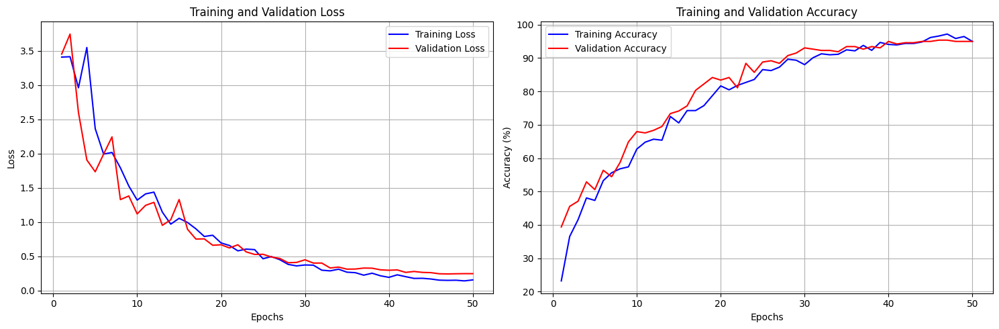

Training metrics plot saved as 'training_metrics.png'


In [ ]:
plot_training_metrics(train_losses, train_accs, val_losses, val_accs)



Per-class Accuracy:
--------------------------------------------------
Diagonal: 96.51% (83/86)
Horizontal: 95.74% (45/47)
Horizontal_large: 100.00% (10/10)
Vertical: 94.44% (17/18)
Vertical_large: 98.25% (56/57)
Web: 84.62% (22/26)
X-shape: 93.33% (14/15)


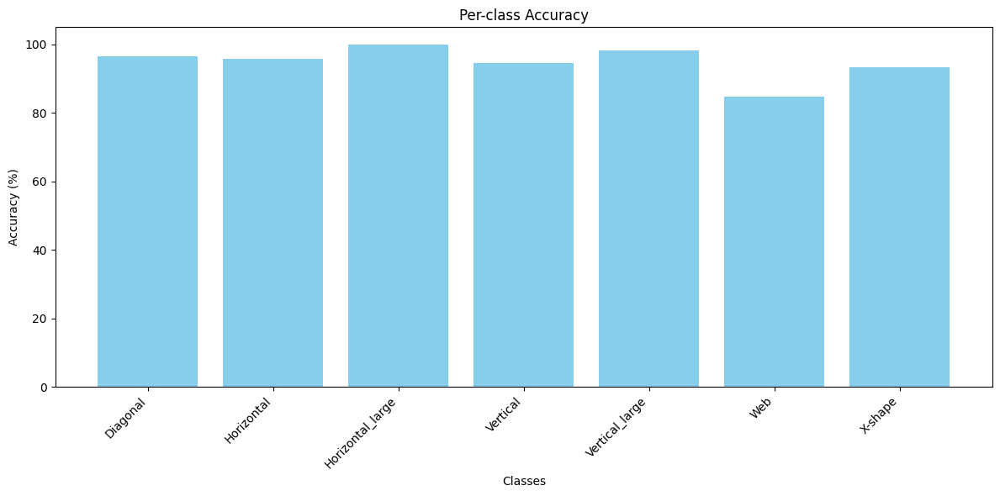

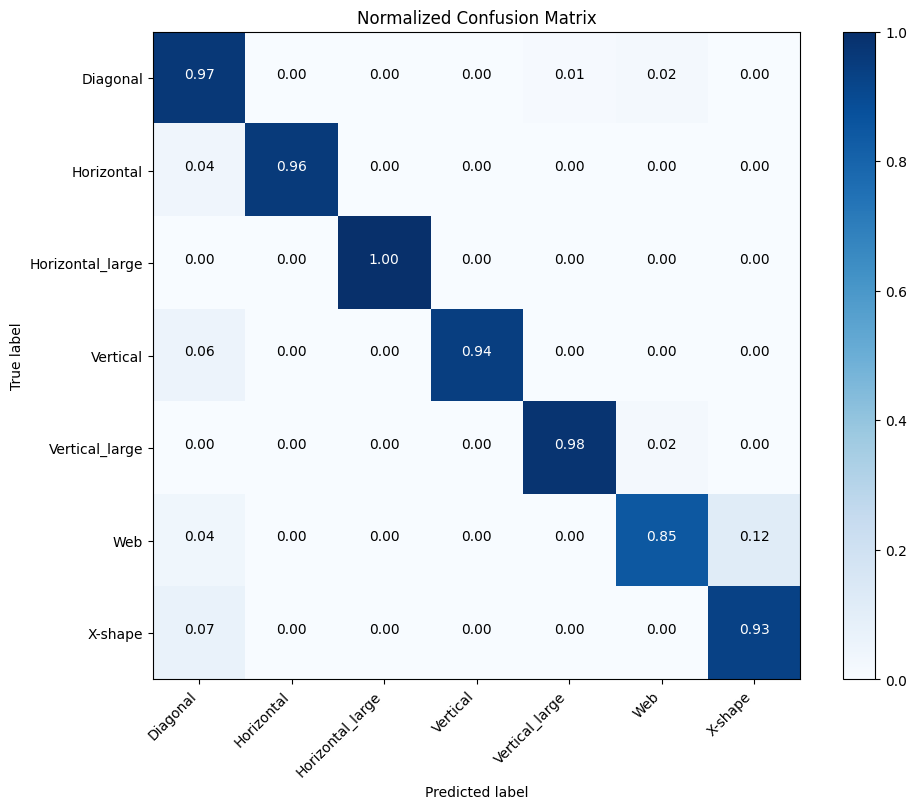

In [ ]:
plot_evaluation_metrics(class_correct, class_total, confusion_matrix)

In [ ]:
with open("/content/drive/MyDrive/FinalColumnModel/vit_model/eval_results.txt", "w") as f:
    total_correct = sum(class_correct)
    total_samples = sum(class_total)
    overall_acc = 100. * total_correct / total_samples

    f.write(f"Overall Accuracy: {overall_acc:.2f}%\n")
    for i, class_name in enumerate(class_names):
        acc = 100. * class_correct[i] / class_total[i] if class_total[i] > 0 else 0.0
        f.write(f"{class_name:20s}: {acc:.2f}% ({class_correct[i]}/{class_total[i]})\n")


In [ ]:
import pandas as pd

cm = confusion_matrix.numpy().astype(int)
df_cm = pd.DataFrame(cm, index=class_names, columns=class_names)
df_cm.to_csv("/content/drive/MyDrive/FinalColumnModel/vit_model/confusion_matrix.csv")


In [ ]:
# Load ViT model
#vit = models.vit_b_16(weights=models.ViT_B_16_Weights.DEFAULT)
#vit.heads = nn.Sequential(nn.Linear(vit.heads[0].in_features, 7))  # 7 classes
#vit.load_state_dict(torch.load("best_vit_model.pth", map_location=device))
#vit = vit.to(device)
#vit.eval()

# 1. Load base ViT (do NOT modify heads)
vit = models.vit_b_16(weights=models.ViT_B_16_Weights.DEFAULT)

# 2. Wrap with your Hough-aware classifier
model = ViTWithHough(vit_model=vit, num_classes=7).to(device)

# 3. Load the full trained model (ViT + Hough)
model.load_state_dict(torch.load("/content/drive/MyDrive/FinalColumnModel/vit_model/best_vit_model.pth", map_location=device))
model.eval()

# Image transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Crack class names (must match training)
class_names = ['Diagonal', 'Horizontal', 'Horizontal_large', 'Vertical', 'Vertical_large', 'Web', 'X-shape']



def predict_vit(model, image, transform, class_names):
    # Transform the image
    image_tensor = transform(image).unsqueeze(0).to(device)

    # Extract Hough features (advanced version!)
    hough_feats = extract_hough_features_advanced(image)  # Must return 9 features
    hough_tensor = torch.tensor(hough_feats, dtype=torch.float32).unsqueeze(0).to(device)

    # Predict
    model.eval()
    with torch.no_grad():
        output = model(image_tensor, hough_tensor)
        pred = torch.argmax(output, dim=1).item()

    return class_names[pred]


Label Mapping

In [ ]:
criteria_map = {
    "column": {
        18: [0, 3, 4, 6, 8],
        19: [5, 7],
        20: [1, 9, 10]
    },
    # also for wall, beam
}

In [ ]:
def map_crack_label_to_criteria(label_name, damage_label, structure_type="column"):
    name = label_name.lower()

    if structure_type == "column":
        if "diagonal" in name:
            return 4 if damage_label == 18 else 5 if damage_label == 19 else None
        elif "horizontal_large" in name or "horizontal" in name:
            return 8 if damage_label == 18 else 9 if damage_label == 20 else None
        elif "vertical_large" in name or "vertical" in name:
            return 6 if damage_label == 18 else 7 if damage_label == 19 else None
        elif "x" in name:
            return 3 if damage_label == 18 else 10 if damage_label == 10 else None
        elif "web" in name:
            return 10 if damage_label == 20 else None
        else:
            return None
    else:
        return None


In [ ]:
rows = []
structure = "column"
image_folder = "/content/datasets/test_data/column"

for img_id in image_ids:
    cls = damage_classes[img_id]  # 18/19/20
    detected_classes = detections.get(img_id, [])
    criteria = []

    if 0 in detected_classes:
        criteria.append(0)  # Exposed rebar → 0

    if 1 in detected_classes:
        crack_boxes = get_yolo_boxes(img_id, 1)  # class 1 = crack
        img_path = os.path.join(image_folder, img_id + ".jpg")
        for box in crack_boxes:
            crop = crop_image(img_path, box)
            #label = predict_vit(vit, crop, transform, class_names)
            label = predict_vit(model, crop, transform, class_names)

            mapped = map_crack_label_to_criteria(label, cls, structure)
            if mapped is not None:
                criteria.append(mapped)

    # Ignore class 2 (spalling) for columns

    # Filter by allowed criteria for this damage class
    allowed = criteria_map[structure][cls]
    filtered = list(set(criteria) & set(allowed))

    row = [img_id, cls] + sorted(filtered)
    rows.append(row)



In [ ]:
# Step 1: Rebuild rows with merged class + criteria
submission_rows = []

for row in rows:
    img_id = int(row[0])  # make sure sorting works as integers
    labels = row[1:]      # class + criteria
    label_str = ",".join(str(x) for x in labels)
    submission_rows.append([img_id, label_str])

# Step 2: Convert to DataFrame and sort by id
submission_df = pd.DataFrame(submission_rows, columns=["id", "class"])
submission_df = submission_df.sort_values(by="id").reset_index(drop=True)

# Step 3: Save in correct format
submission_df.to_csv("final_submission_column.csv", index=False, header=True)



In [ ]:
from google.colab import files
files.download("final_submission_column.csv")


Check Result

In [ ]:
criteria_map = {
    18: {
        0: "Exposed Rebar",
        3: "X and V-shaped crack",
        4: "Continuous Diagonal crack",
        6: "Continuous Vertical crack",
        8: "Continuous Horizontal crack"
    },
    19: {
        5: "Diagonal discontinuous",
        7: "Vertical discontinuous"
    },
    20: {
        1: "No significant damage",
        9: "Discontinuous horizontal crack",
        10: "small crack"
    }
}



0: 640x192 (no detections), 19.8ms
Speed: 0.9ms preprocess, 19.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 192)


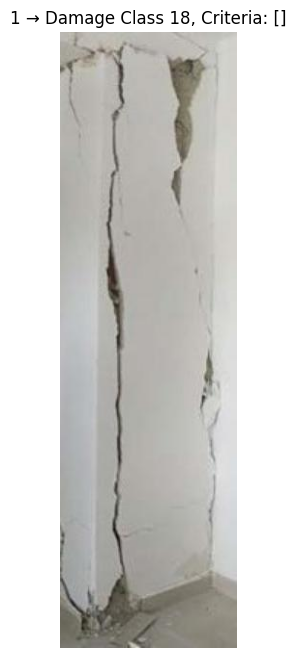


0: 640x448 4 cracks, 1 spalling, 21.2ms
Speed: 1.6ms preprocess, 21.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 448)


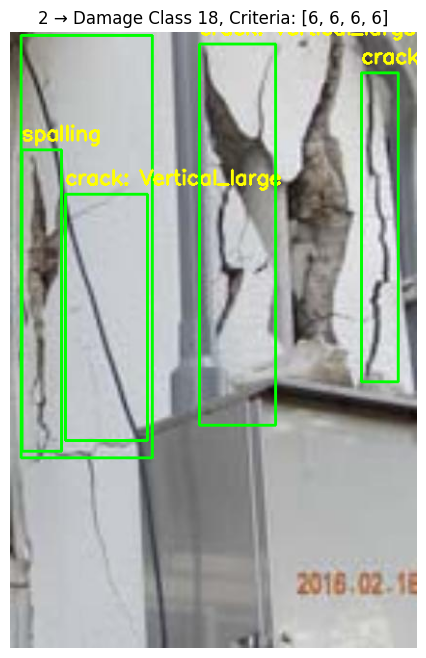


0: 640x192 2 cracks, 2 spallings, 20.0ms
Speed: 1.4ms preprocess, 20.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 192)


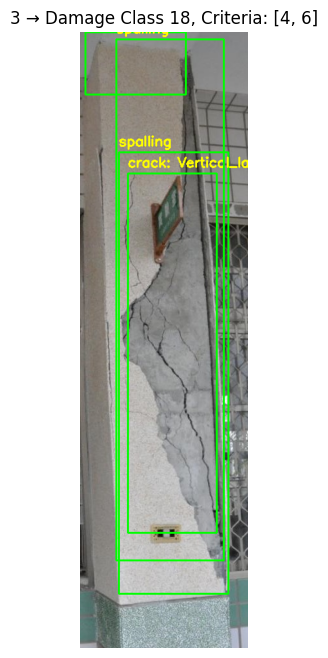


0: 640x384 1 crack, 1 spalling, 21.0ms
Speed: 1.4ms preprocess, 21.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 384)


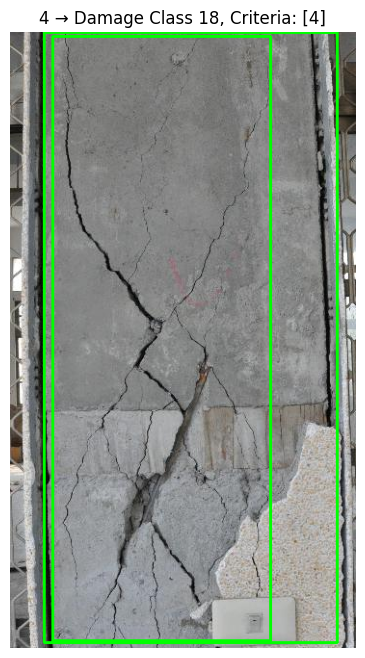


0: 640x320 1 rebar, 1 spalling, 19.9ms
Speed: 1.3ms preprocess, 19.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 320)


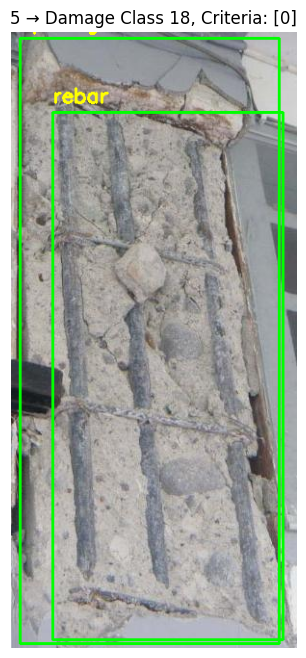


0: 640x256 2 cracks, 1 spalling, 19.7ms
Speed: 1.1ms preprocess, 19.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 256)


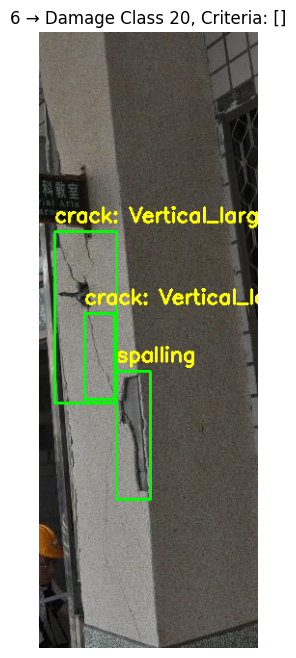


0: 640x224 1 crack, 1 spalling, 20.1ms
Speed: 1.3ms preprocess, 20.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 224)


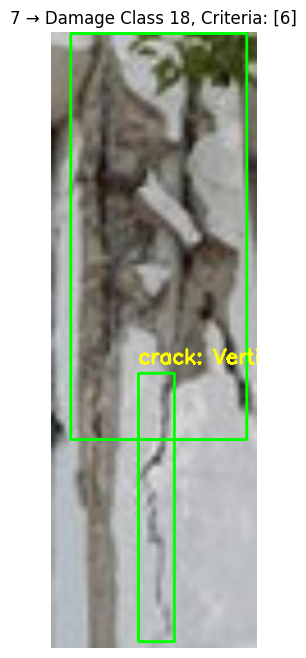


0: 640x224 2 rebars, 1 spalling, 19.3ms
Speed: 1.3ms preprocess, 19.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 224)


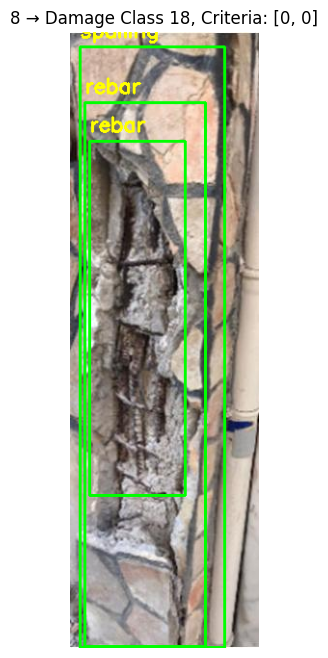


0: 640x320 4 cracks, 21.3ms
Speed: 2.6ms preprocess, 21.3ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 320)


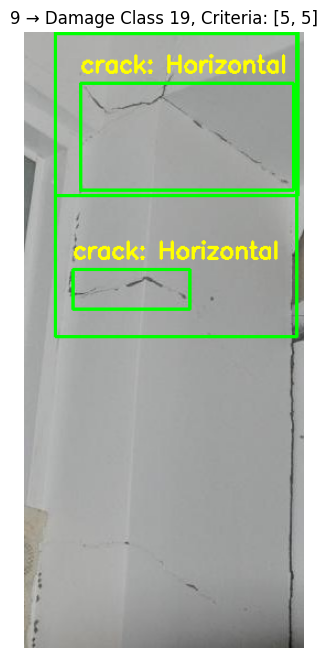


0: 640x256 2 cracks, 20.5ms
Speed: 1.3ms preprocess, 20.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 256)


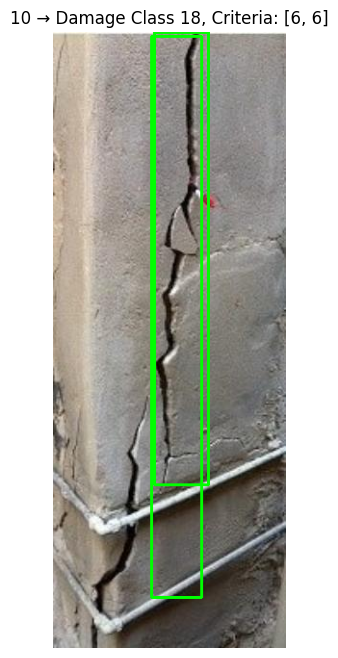


0: 640x160 1 crack, 19.7ms
Speed: 1.7ms preprocess, 19.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 160)


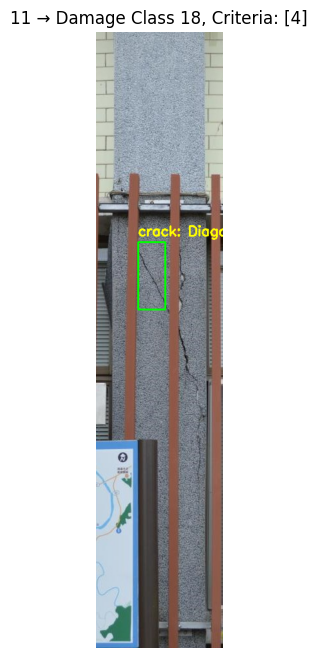


0: 640x160 1 crack, 1 spalling, 19.8ms
Speed: 1.2ms preprocess, 19.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 160)


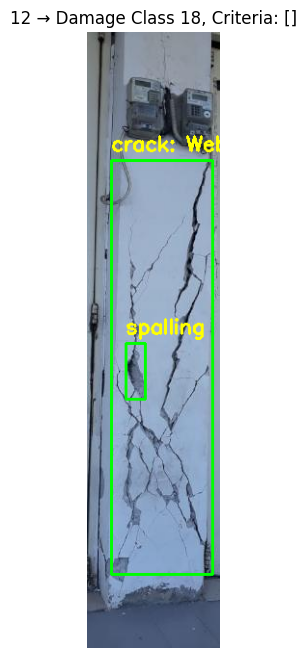


0: 640x128 1 spalling, 19.7ms
Speed: 0.9ms preprocess, 19.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 128)


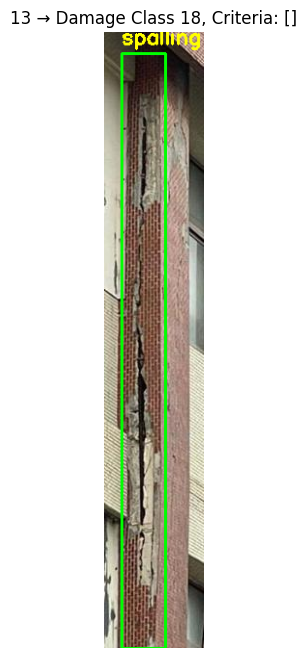


0: 640x416 1 rebar, 1 crack, 1 spalling, 21.0ms
Speed: 2.3ms preprocess, 21.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 416)


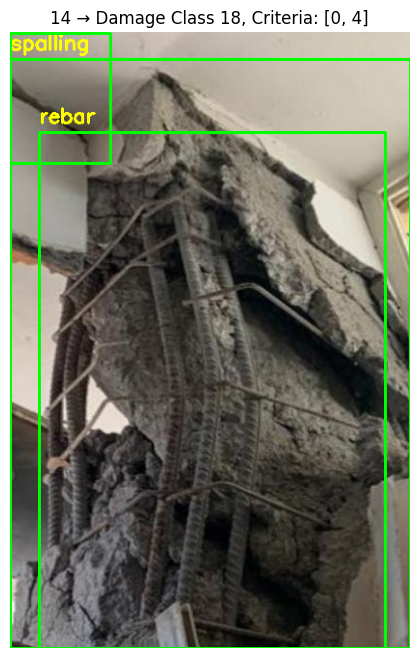


0: 640x352 2 cracks, 1 spalling, 21.3ms
Speed: 3.3ms preprocess, 21.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 352)


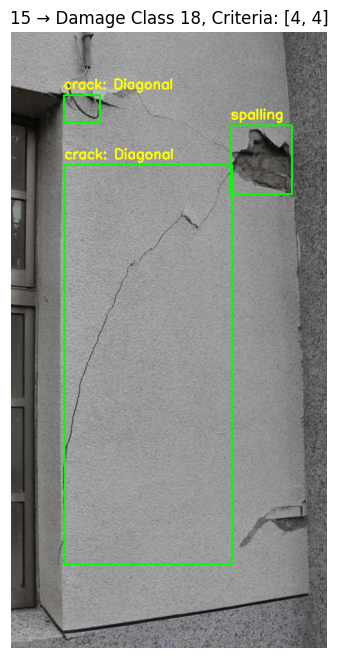


0: 640x320 1 crack, 2 spallings, 21.0ms
Speed: 1.8ms preprocess, 21.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 320)


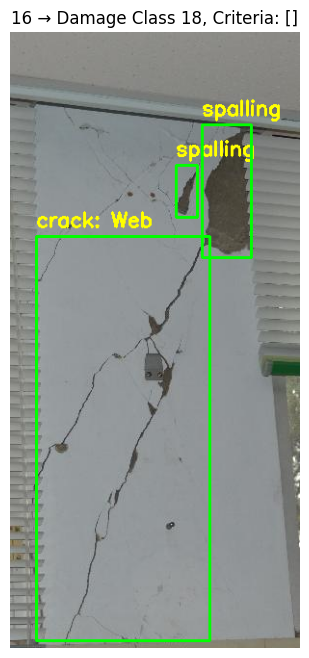


0: 640x416 1 crack, 2 spallings, 24.1ms
Speed: 2.1ms preprocess, 24.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 416)


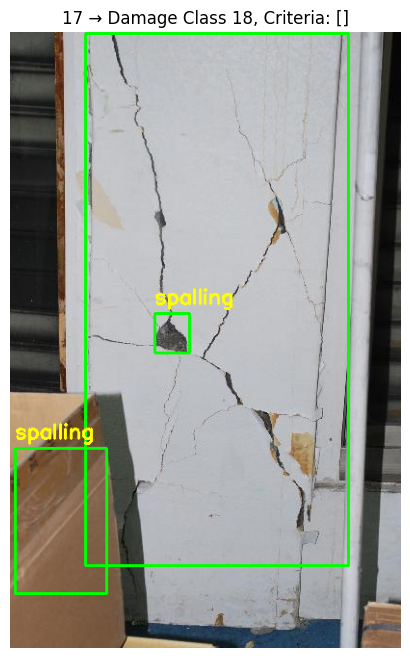


0: 640x160 2 cracks, 2 spallings, 20.7ms
Speed: 0.9ms preprocess, 20.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 160)


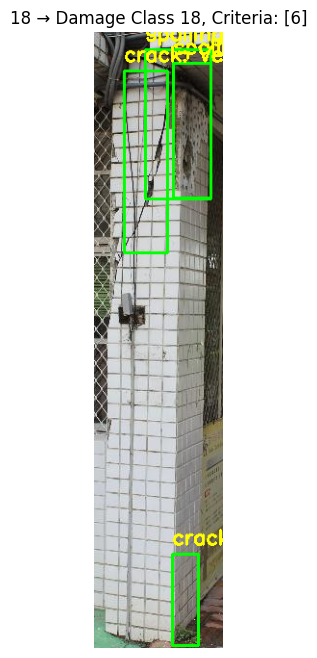


0: 448x640 4 cracks, 21.1ms
Speed: 1.7ms preprocess, 21.1ms inference, 1.9ms postprocess per image at shape (1, 3, 448, 640)


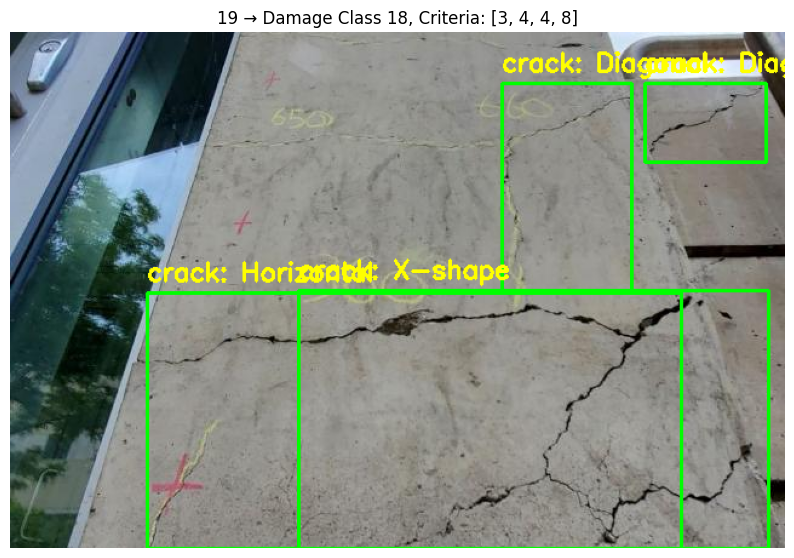


0: 640x320 2 cracks, 20.8ms
Speed: 1.9ms preprocess, 20.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 320)


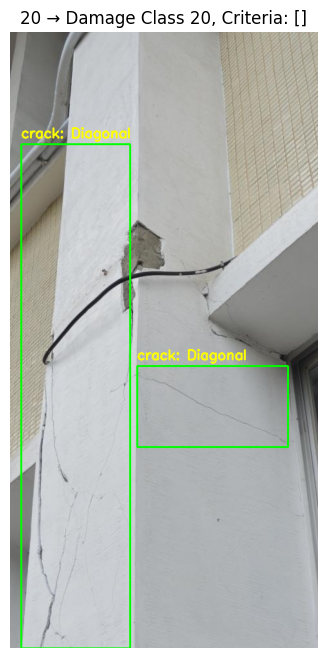


0: 640x256 3 cracks, 2 spallings, 21.3ms
Speed: 1.5ms preprocess, 21.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 256)


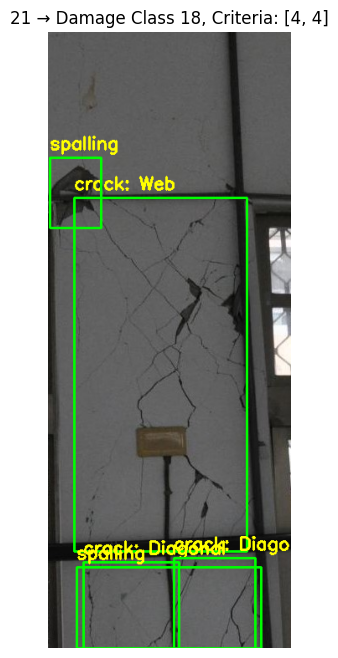


0: 640x384 2 cracks, 1 spalling, 21.6ms
Speed: 3.0ms preprocess, 21.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 384)


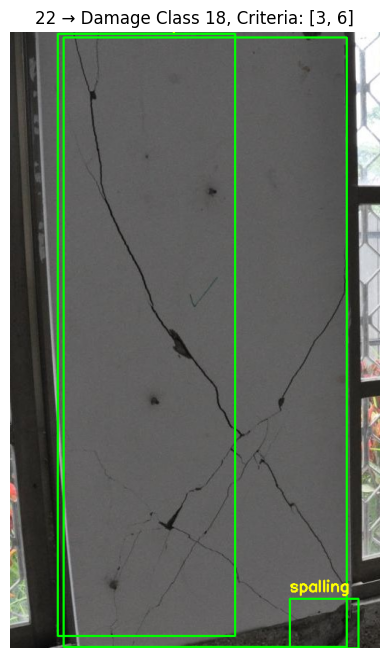


0: 640x192 2 cracks, 4 spallings, 21.3ms
Speed: 1.3ms preprocess, 21.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 192)


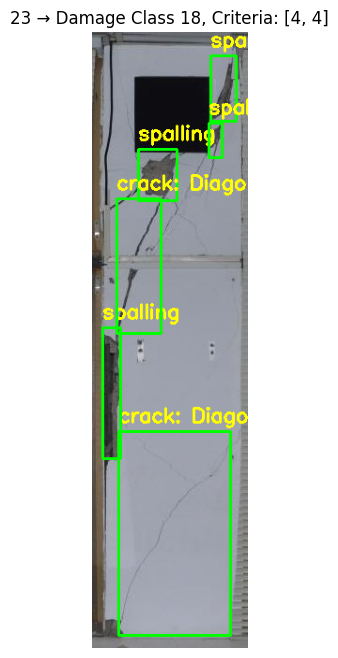


0: 640x512 1 crack, 1 spalling, 21.6ms
Speed: 1.8ms preprocess, 21.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 512)


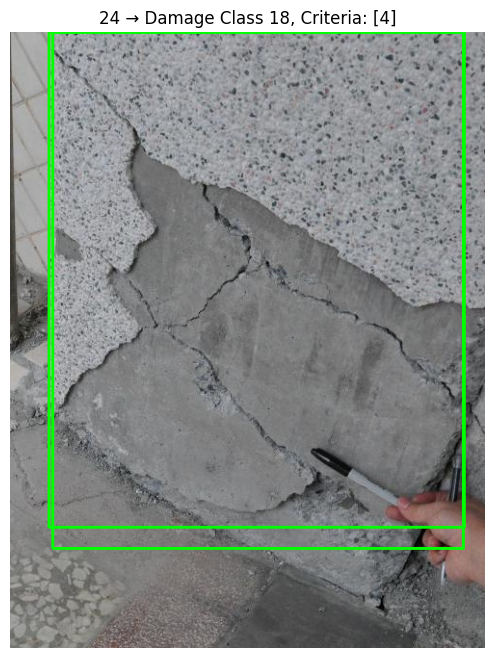


0: 640x160 1 crack, 19.2ms
Speed: 0.8ms preprocess, 19.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 160)


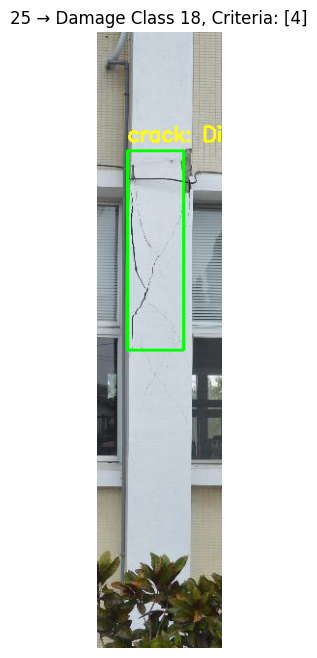


0: 640x192 3 cracks, 1 spalling, 19.2ms
Speed: 0.9ms preprocess, 19.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 192)


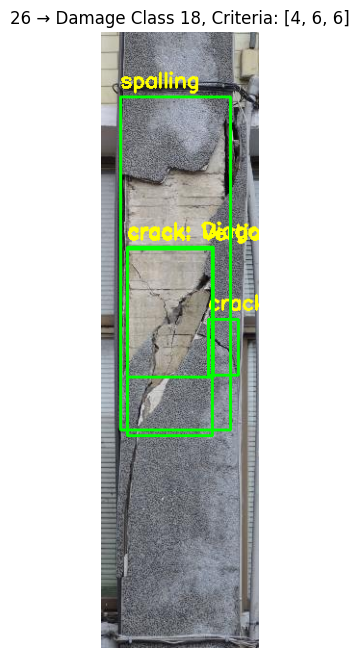


0: 640x192 1 crack, 19.1ms
Speed: 1.0ms preprocess, 19.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 192)


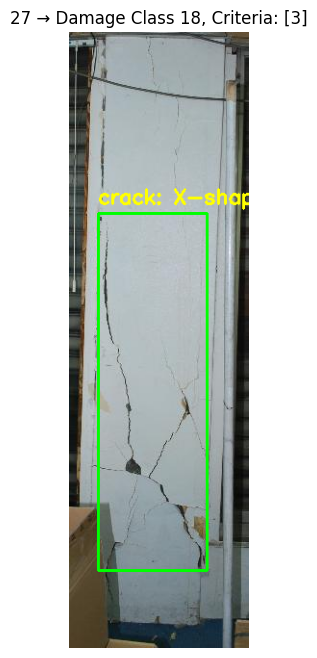


0: 640x160 1 crack, 2 spallings, 19.1ms
Speed: 0.9ms preprocess, 19.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 160)


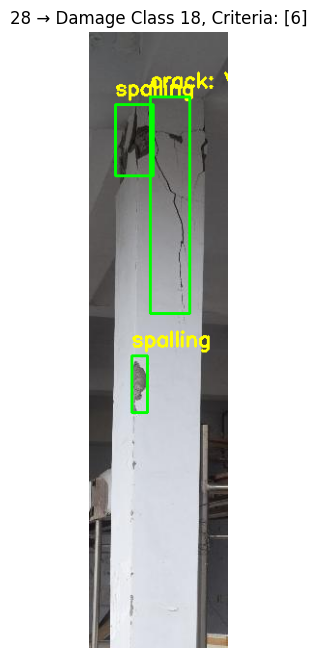


0: 640x384 2 rebars, 1 spalling, 21.7ms
Speed: 1.4ms preprocess, 21.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 384)


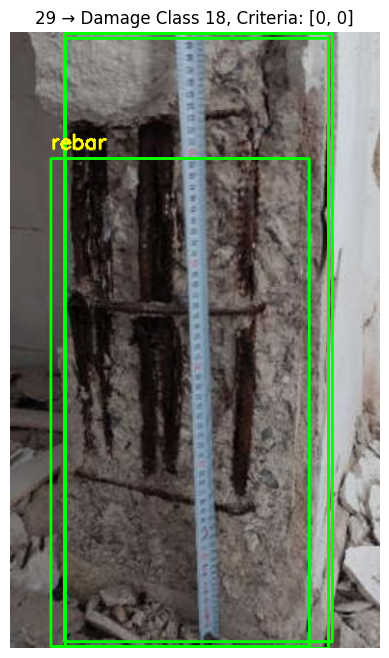


0: 640x192 1 spalling, 19.8ms
Speed: 1.2ms preprocess, 19.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 192)


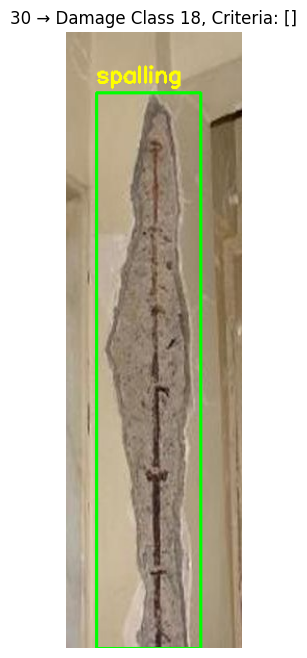


0: 640x384 4 cracks, 1 spalling, 21.8ms
Speed: 2.1ms preprocess, 21.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 384)


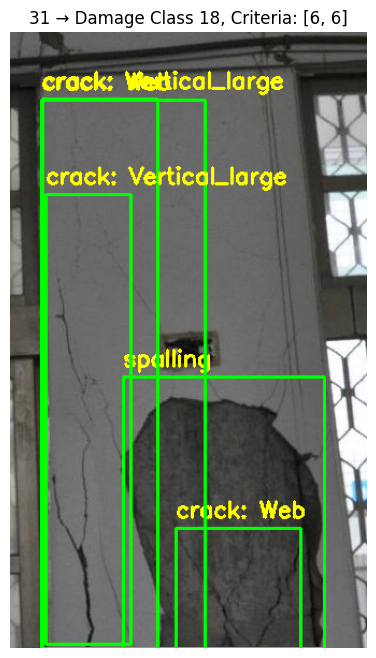


0: 640x192 1 spalling, 20.4ms
Speed: 1.0ms preprocess, 20.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 192)


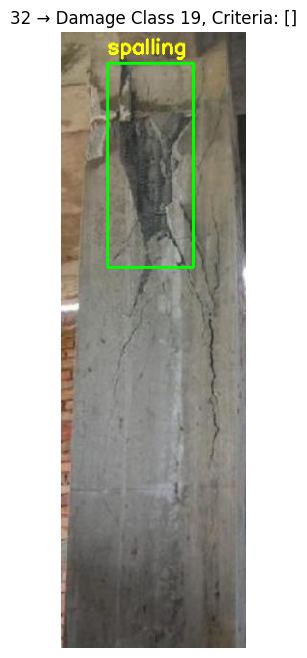


0: 544x640 2 cracks, 21.3ms
Speed: 2.4ms preprocess, 21.3ms inference, 2.0ms postprocess per image at shape (1, 3, 544, 640)


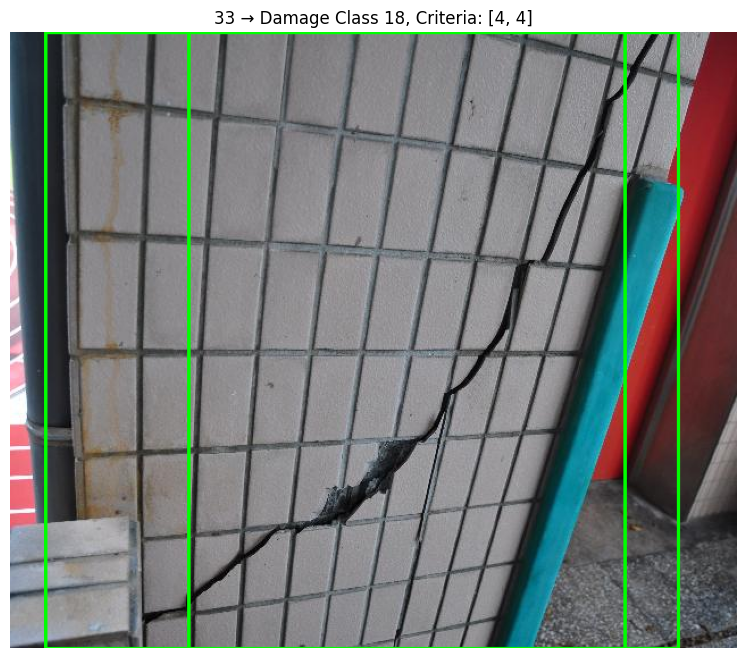


0: 640x192 2 cracks, 2 spallings, 19.8ms
Speed: 1.2ms preprocess, 19.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 192)


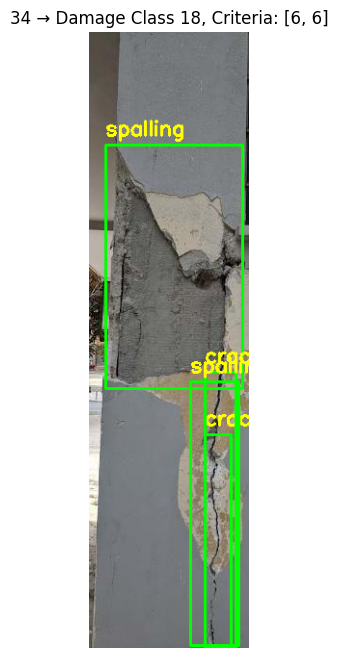


0: 640x256 1 crack, 20.4ms
Speed: 1.5ms preprocess, 20.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 256)


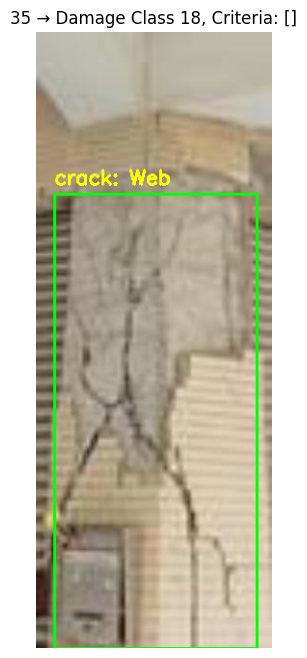


0: 640x448 4 cracks, 3 spallings, 21.5ms
Speed: 2.5ms preprocess, 21.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 448)


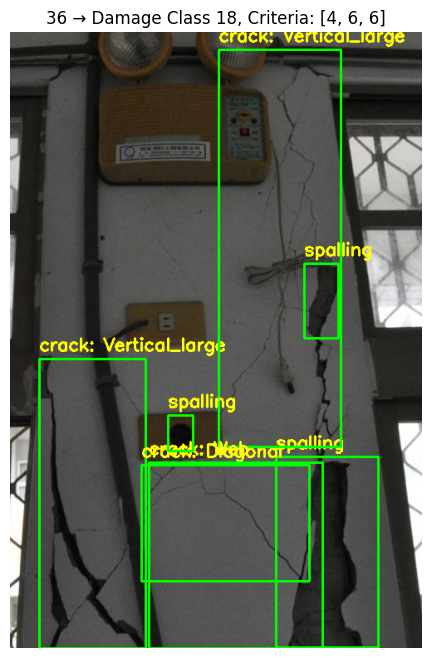


0: 640x288 1 spalling, 21.5ms
Speed: 1.3ms preprocess, 21.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 288)


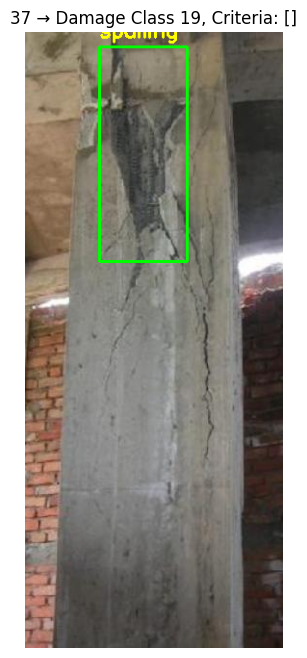


0: 640x384 1 rebar, 3 cracks, 3 spallings, 22.4ms
Speed: 1.5ms preprocess, 22.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 384)


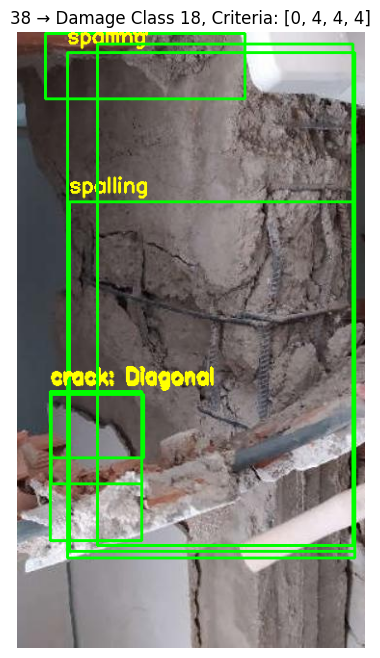


0: 640x320 2 cracks, 20.0ms
Speed: 2.0ms preprocess, 20.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 320)


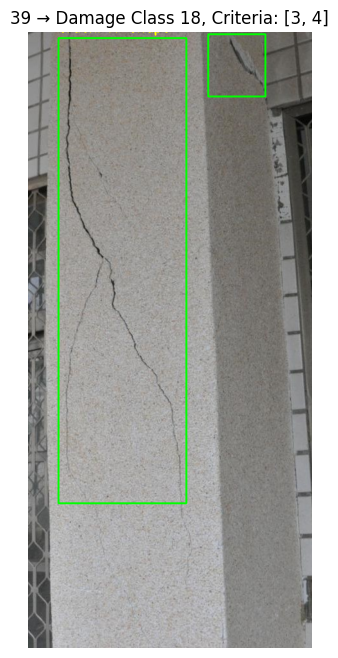


0: 640x288 1 crack, 1 spalling, 21.3ms
Speed: 1.2ms preprocess, 21.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 288)


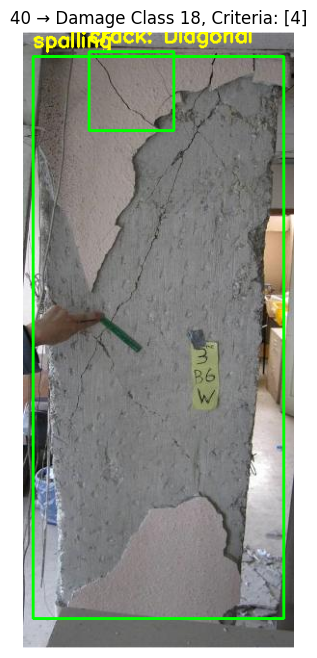


0: 640x448 4 rebars, 2 spallings, 20.9ms
Speed: 1.6ms preprocess, 20.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 448)


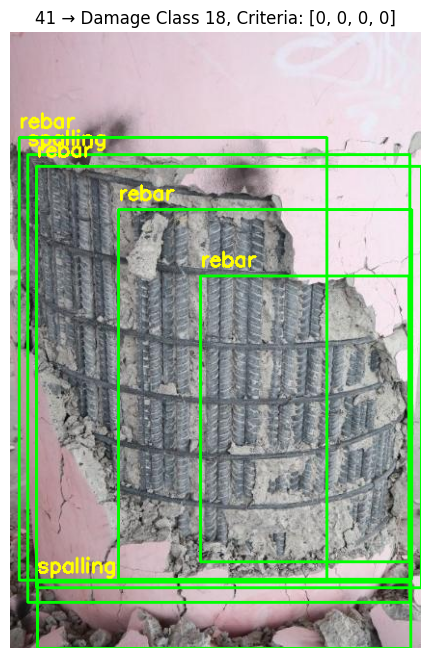


0: 576x640 4 cracks, 1 spalling, 21.6ms
Speed: 3.3ms preprocess, 21.6ms inference, 1.9ms postprocess per image at shape (1, 3, 576, 640)


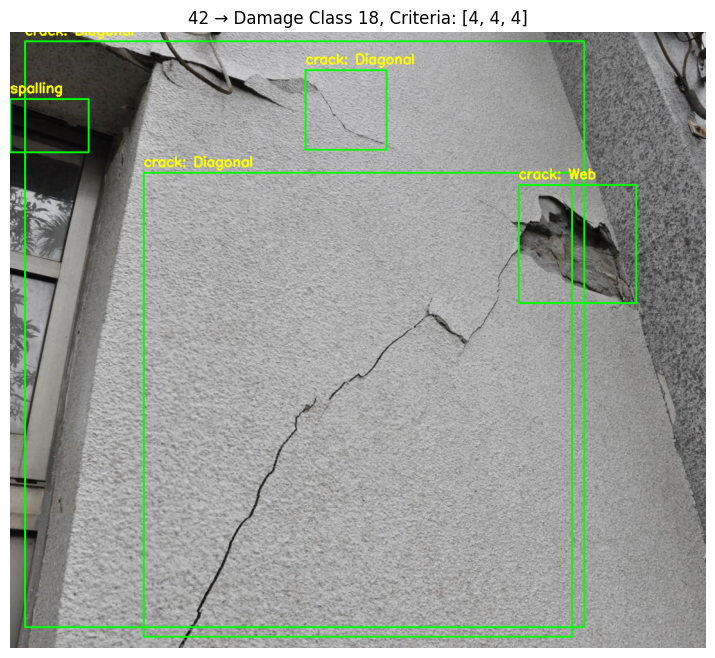


0: 640x192 2 cracks, 25.1ms
Speed: 1.1ms preprocess, 25.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 192)


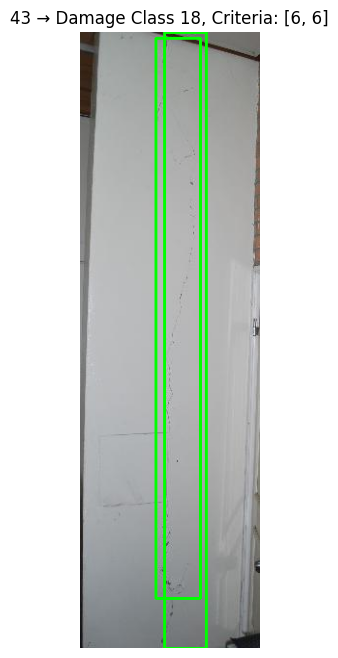


0: 640x416 2 rebars, 1 crack, 1 spalling, 22.1ms
Speed: 1.8ms preprocess, 22.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 416)


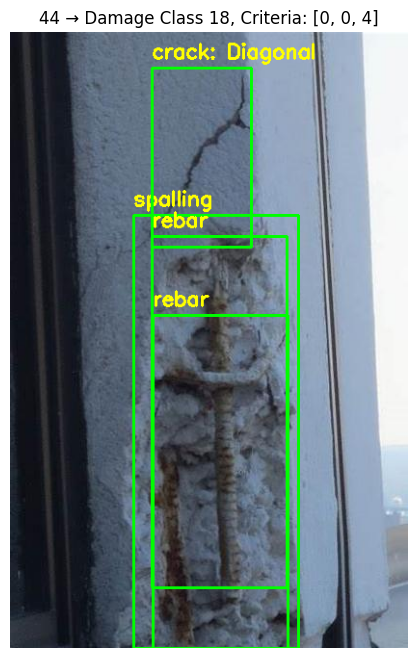


0: 640x352 2 rebars, 1 spalling, 20.4ms
Speed: 1.6ms preprocess, 20.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 352)


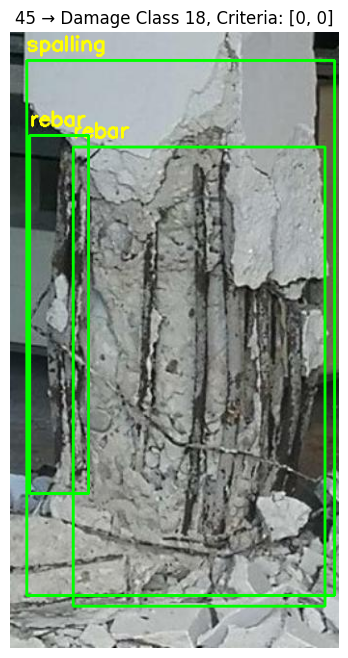


0: 640x224 2 cracks, 1 spalling, 20.2ms
Speed: 1.5ms preprocess, 20.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 224)


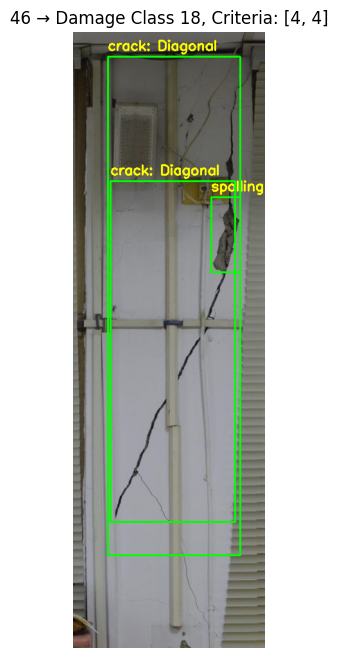


0: 640x160 3 cracks, 2 spallings, 21.1ms
Speed: 0.9ms preprocess, 21.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 160)


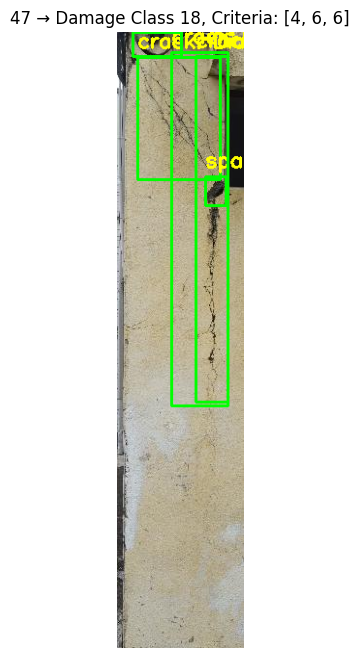


0: 640x608 3 rebars, 1 spalling, 21.9ms
Speed: 2.0ms preprocess, 21.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 608)


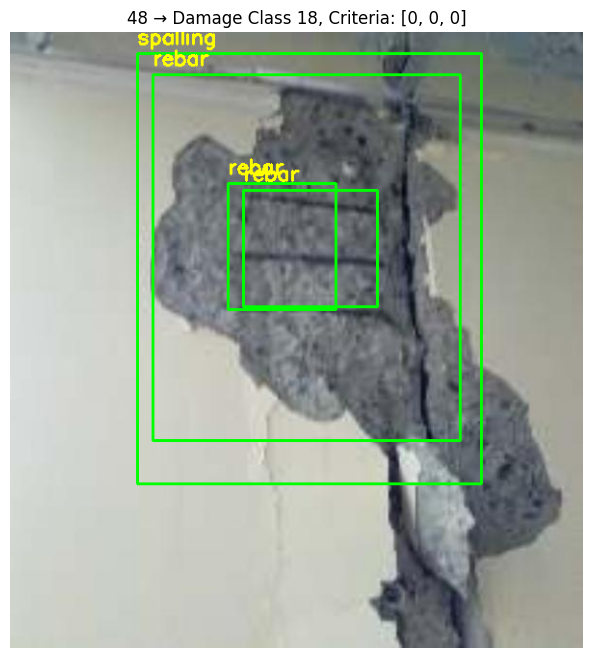


0: 640x480 2 rebars, 2 spallings, 21.6ms
Speed: 1.9ms preprocess, 21.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 480)


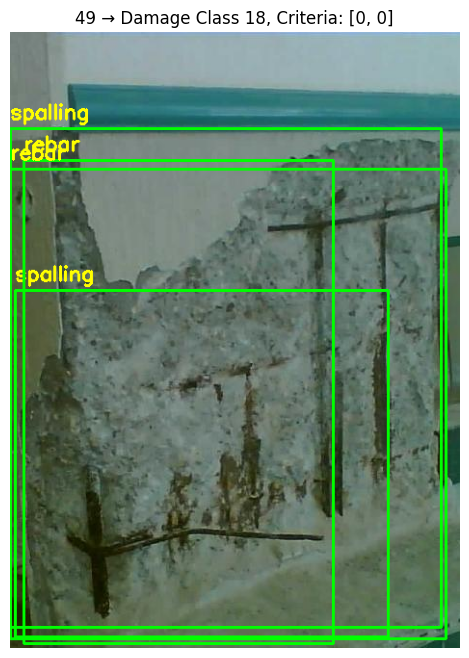


0: 640x256 1 crack, 3 spallings, 20.1ms
Speed: 1.5ms preprocess, 20.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 256)


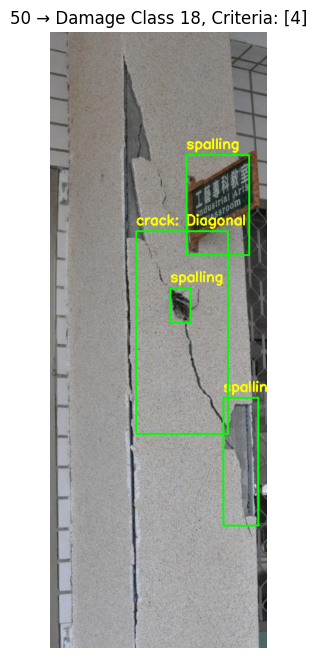

In [ ]:
image_folder = "/content/datasets/test_data/column"
yolo_model = YOLO("/content/drive/MyDrive/FinalColumnModel/column_detector_best.pt")
yolo_class_names = ['rebar', 'crack', 'spalling']



for img_id in image_ids:
    img_path = os.path.join(image_folder, img_id + ".jpg")
    criteria = process_image(
        img_id=img_id,
        image_path=img_path,
        detections=detections,
        damage_classes=damage_classes,
        model=model,
        transform=transform,
        class_names=class_names
    )


In [ ]:
!pip freeze > requirements.txt


In [ ]:
from google.colab import files
files.download("requirements.txt")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
env_text = """
name: column-classification-env
channels:
  - defaults
  - conda-forge
dependencies:
  - python=3.10
  - pip
  - numpy
  - pandas
  - matplotlib
  - scikit-learn
  - pip:
      - torch==2.6.0
      - torchvision==0.21.0
      - timm==1.0.15
      - transformers==4.52.4
      - ultralytics==8.3.152
      - tqdm
      - opencv-python==4.11.0.86
"""

with open("environment.yml", "w") as f:
    f.write(env_text)

from google.colab import files
files.download("environment.yml")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>